# Francesco/Esteves/Valle Model — Análise Completa com Benchmarks Setoriais

Avalia o portfólio **Francesco/Esteves/Valle Model** otimizado contra benchmarks dos **11 setores GICS (Global Industry Classification Standard)**
(retorno equal-weighted de cada setor do S&P 500).

| Modelo | Benchmark de otimização |
|--------|------------------------|
| **Francesco/Esteves/Valle Model** | Benchmark sintético $=\max_k\bigl(\mathrm{Tail}_{s/S^k}\bigr)$ dos 11 setores |
| **Roman Model (Scaled)** | SP500 (referência) |
| **Francesco/Esteves/Valle Model (Factors)** | Benchmark sintético dos fatores Fama-French |

> **v2** — revisão desta análise após a reunião de alinhamento de 2026-07-23. Os pontos levantados
> na reunião e as correções aplicadas em relação à v1 estão na seção logo abaixo.


---
## Pendências abertas — reunião de 2026-07-23

Itens levantados na reunião que **não** estão cobertos por este notebook, com o que cada um exige.

| # | Pendência | O que falta | Status |
|---|---|---|---|
| 6 | **Grade 2×2 de modelos** — Roma *scaled*, Roma *unscaled*, este trabalho *scaled*, este trabalho *unscaled* | Implementados o **Francesco/Esteves/Valle Model (Unscaled)** — a mesma formulação setorial deste trabalho, trocando a restrição de max-min $\frac{s}{S}V \le V_s$ por $V \le V_s$ — e o **Roman Model (Unscaled)**, de benchmark único (SP500), par natural do **Roman Model (Scaled)** que já figurava nas comparações; o universo do Roman unscaled foi alinhado aos mesmos 600 ativos dos demais. Resultados na seção *14d*. **Ressalva:** não cobre a variante *unscaled* da **formulação de Roma multi-benchmark** (MultiSSD), que a redação original deste item também previa | **feito** |
| 7 | **Escalarização aplicada ao modelo unscaled** | É o próprio item 6: aplicar o fator $k/S$ ao modelo unscaled equivale a passar da formulação Tail para a CVaR. Coberto pela seção *14d* | **feito** |
| 8 | **Teste de equivalência** — formulação original (todas as restrições, todos os benchmarks) vs. formulação com benchmark sintético | Rodar a **formulação de Roma (MultiSSD)** com os 11 setores e confrontar com o **Francesco/Esteves/Valle Model**. As duas devem convergir para a **mesma solução ótima**, com tempos de solução diferentes. Implementada como **MultiSSD de Roma com benchmarks setoriais** — todos os setores no mesmo modelo; resultados na seção *14c. Teste de equivalência* | **feito** |
| 9 | **Período OOS mais longo** | Fora do escopo desta revisão, por decisão | adiado |
| 10 | **Minimum variance como benchmark histórico** | Implementar o portfólio de variância mínima e incluí-lo na comparação | pendente |
| 17 | **Submissão** — discutir com Cristiano, incorporar o modelo do Francesco | Não é código | pendente |

**Hipótese registrada para o item 6.** A expectativa levantada na reunião é que a formulação deste
trabalho supere a de Roma em ambos os regimes — *scaled* (CVaR) e *unscaled* (Tail) — pelo ganho da
maximização da cauda. O teste do item 8 é logicamente anterior: só faz sentido comparar desempenho
depois de confirmar que a reformulação com benchmark sintético preserva a solução ótima.

Vale notar que as duas dimensões da grade 2×2 são independentes e testam coisas diferentes: o eixo
Roma/sintético testa **equivalência** (as soluções devem coincidir, mudando só o tempo de solução),
enquanto o eixo scaled/unscaled testa **preferência** (as soluções devem divergir, porque as funções
objetivo são genuinamente diferentes).

**Ganchos de carregamento.** Quando os modelos das pendências 6, 8 e 10 rodarem, basta que gravem
seus portfólios no padrão `output/<modelo>/portfolio_<modelo>.csv`; o bloco de carregamento deste
notebook usa `if path.exists()` e passa a incluí-los automaticamente em todas as figuras e tabelas.

---

### Resumo das correções aplicadas nesta v2

| Item da reunião | Onde |
|---|---|
| 1 — cálculo do benchmark sintético (`cumsum` → `max`) | já corrigido no **Francesco/Esteves/Valle Model**; este notebook consome o $\tau$ sintético resultante |
| 2 — rótulos do benchmark sintético por janela | seção *Synthetic Benchmark por janela de rebalanceamento* |
| 3 — verificar coincidência entre sintético e Energy | seção *Benchmark sintético vs. ENERGY* |
| 4 — refazer o painel de drawdown | seção *Drawdown comparativo* (escala compartilhada, marcadores de máximo) |
| 5 — cores invertidas no Max Drawdown | tabela de métricas |
| 11 — fórmulas de drawdown e CAGR | seções *Definição de drawdown* e *Métricas — definições* |
| 12 — semi-volatilidade | coluna `Semi-volatility (%)` e Sortino corrigido |
| 13 — retorno médio (numerador de Sharpe/Sortino) | coluna `Mean return (%)` |
| 14 — beta explicitamente contra o SP500 | coluna `Beta vs SP500` e cabeçalho do sumário |
| 15 — dominância estocástica como número | colunas `min SSD`, `% ranks SSD≥0`, `Área violação` |
| 16 — métricas adicionais | `Calmar Ratio`, além das acima |
| taxonomia dos modelos | seção *0. Taxonomia dos modelos* — scaled ⟺ CVaR, unscaled ⟺ Tail, com a derivação |


---
## Configurações do Experimento
| Parâmetro | Valor |
|------------|--------|
| **Modelo** | TAF-MultiSSD (tafmSSD) — SSD multi-benchmark, benchmark sintético (operador *max_k*) |
| **Formulação** | MIP com lazy constraints (callback CPLEX; variável binária dummy `cb_temp`) |
| **Janela in-sample** | 200 dias (janela deslizante) |
| **Universo** | ~505 ativos componentes do S&P 500 (após remoção de >15% de valores ausentes) |
| **Benchmark** | Sintético $=\max_k\bigl(\mathrm{Tail}_{s/S^k}\bigr)$ dos 11 setores GICS |
| **Frequência de rebalanceamento** | A cada 21 dias úteis |
| **Período out-of-sample** | 2024-01-02 a 2024-06-01 |
| **Número de rebalanceamentos** | 5 |
| **Custos de transação** | Nenhum |
| **Lotes mínimos** | Nenhum |

---

**Estrutura:**
- Pontos da reunião de 2026-07-23 e correções aplicadas nesta v2
0. Taxonomia dos modelos
1. Setup
2. Carregamento de dados e modelos
3. Contexto de mercado — setores OOS
4. Benchmark sintético OOS — setor dominante
5. Constraint tightness — $\tau_k$ por setor por janela
6. Setor dominante por rank (+ resumo numérico)
6b. Benchmark sintético vs. ENERGY — verificação de coincidência
7. Visão geral — portfólio vs setores
8. Drawdown comparativo (+ definição formal)
9. Métricas OOS — tabela completa (+ definições)
10. Dominância SSD
10b. Dominância SSD — CDFs e integrais cumulativas (grade scaled × unscaled)
10c. r_P vs r_B por quantil — análise de cauda
11. Análise risco × retorno
12. Distribuição e correlação
13. Retornos em janela deslizante
14. Sumário executivo
14b. Diagnóstico do solver (CPLEX)
14c. Teste de equivalência — formulação original (K setores) vs. benchmark sintético
14d. Grade 2×2 — Roman vs. este trabalho × scaled vs. unscaled


---
## 0. Taxonomia dos modelos

Ponto de alinhamento da reunião: os nomes vinham sendo usados de forma ambígua. Duas dimensões,
e só duas, distinguem os modelos deste projeto.

**Dimensão 1 — escalamento, que é o mesmo que a escolha da medida de cauda.**
Com $S$ cenários equiprováveis e as estatísticas de ordem $r_{(1)} \le \dots \le r_{(S)}$, as duas
medidas de cauda no rank $k$ (nível $p = k/S$) são:

$$\mathrm{Tail}_{p}(R) \;=\; \frac{1}{S}\sum_{s=1}^{k} r_{(s)}
\qquad\qquad
\mathrm{CVaR}_{p}(R) \;=\; \frac{1}{k}\sum_{s=1}^{k} r_{(s)}$$

A **Tail** é a esperança *incondicional* dos $k$ piores cenários; o **CVaR**, a *condicional*.
Uma é a outra reescalada:

$$\mathrm{Tail}_{p}(R) \;=\; p \cdot \mathrm{CVaR}_{p}(R), \qquad p = k/S$$

É exatamente esse fator $p$ que aparece na restrição de max-min e dá nome ao modelo:

| | Restrição de max-min | Objetivo resultante |
|---|---|---|
| **Unscaled** | $V \le V_k$ | $V^\star = \min_k \sum_{s\le k}\left(r_{P,(s)} - r_{B,(s)}\right) = S\cdot\min_k\left[\mathrm{Tail}_{k/S}(R_P) - \mathrm{Tail}_{k/S}(R_B)\right]$ |
| **Scaled** | $\frac{k}{S}\,V \le V_k$ | $V^\star = \min_k \dfrac{\mathrm{Tail}_{k/S}(R_P) - \mathrm{Tail}_{k/S}(R_B)}{k/S} = \min_k\left[\mathrm{CVaR}_{k/S}(R_P) - \mathrm{CVaR}_{k/S}(R_B)\right]$ |

Ou seja: **o modelo *scaled* maximiza a menor diferença de CVaR; o *unscaled*, a menor diferença
de Tail.

> **Cuidado com uma ambiguidade de nomenclatura.** A esperança incondicional $\mathrm{Tail}$ é a
> medida que aparece nas restrições das **duas** variantes: é sempre ela que descreve o perfil de
> cauda do benchmark ($\tau_k[s] = \mathrm{Tail}_{s/S^k}$) e o do portfólio. O que distingue
> *scaled* de *unscaled* **não** é a medida usada na restrição, e sim o coeficiente que multiplica
> $V$ na restrição de max-min:
>
> $$\underbrace{\frac{s}{S}\,V \;\le\; V_s}_{\text{scaled}}
> \qquad\text{vs.}\qquad
> \underbrace{V \;\le\; V_s}_{\text{unscaled}},
> \qquad\text{com}\qquad
> V_s \;\le\; \mathrm{Tail}_{s/S}(R_P) - \tau_k[s] \ \text{ em ambos.}$$
>
> Dividir por $s/S$ converte a diferença de Tail em diferença de CVaR — daí a equivalência
> *scaled* ⟺ CVaR. Portanto, ler "$\tau_k$ é a esperança incondicional" nas seções seguintes
> **não** significa que o modelo ali descrito seja o *unscaled*: ele é o *scaled*, e o $\tau$
> dele é o mesmo do *unscaled*.

**Dimensão 2 — como os $K$ benchmarks entram no problema.**

- **Formulação de Roma (Cristiano)** — impõe as restrições SSD para *todos* os cenários **e**
  *todos* os $K$ benchmarks, com $K$ conjuntos de variáveis $V_{k,t}$.
- **Formulação com benchmark sintético (este trabalho)** — substitui os $K$ benchmarks por um só,
  $\tau_{\text{synth}}[s] = \max_k \mathrm{Tail}_{s/S^k}(I^k)$, com um único conjunto de $V_t$.

As duas **devem produzir a mesma solução ótima**; a segunda é uma reformulação equivalente e mais
barata de resolver. Verificar isso empiricamente é uma pendência aberta (ver seção final).


### Por que a escolha muda o portfólio ótimo

Como *teste de viabilidade* os dois são equivalentes — $V^\star \ge 0$ em um vale se e somente se
vale no outro, e ambos caracterizam dominância SSD. A diferença está na *função objetivo*, quando
a dominância não é atingível e o modelo precisa escolher o "menos ruim".

No **unscaled**, todo rank entra com peso $1/S$. Como a diferença de Tail em $k$ pequeno é uma soma
de poucos termos, ela é mecanicamente pequena — o mínimo tende a ser atingido no miolo ou na parte
alta da distribuição, e a cauda extrema quase não disputa a posição binding.

No **scaled**, cada rank é normalizado pela própria probabilidade de cauda, e o fator $S/k$
amplifica a cauda extrema em até $S$ vezes: um déficit no pior cenário isolado ($k=1$) passa a
pesar tanto quanto o déficit médio de toda a distribuição. O modelo fica substancialmente mais
conservador, com a restrição binding migrando para os ranks baixos.

Há ainda a diferença de interpretação de $V^\star$. No scaled ele é livre de escala e se lê
diretamente: *o CVaR do portfólio supera o do benchmark em pelo menos $V^\star$ em todos os níveis
de confiança*. No unscaled, $V^\star$ está em unidades de retorno acumulado e cresce com $S$, o que
o torna incomparável entre janelas de tamanhos diferentes.


---
## 1. Setup

In [1]:
import sys, warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from collections import Counter

warnings.filterwarnings('ignore')

ROOT             = Path('..').resolve()
SRC              = ROOT / 'src'
OUTPUT_DIR       = SRC / 'output'
SECTORS_DIR_OUT  = OUTPUT_DIR / 'tafmssd-sectors'
TAFMSSD_DIR      = OUTPUT_DIR / 'tafmssd'
SCSSD_DIR        = OUTPUT_DIR / 'scssd'
DATA_DIR         = SRC / 'data'
SECTORS_DATA_DIR = DATA_DIR / 'sectors'

sys.path.insert(0, str(SRC))
from metrics.stats import compute_ssd_dominance, compute_metrics
from blotter.plots import (
    plot_market_context, plot_performance,
    plot_dominance_overview, plot_dominance_panels,
    plot_risk_return_scatter, plot_return_distribution,
    plot_correlation_matrix, plot_drawdown, plot_rolling_returns,
    plot_portfolio_comparison,
)

import re as _re
from IPython.display import HTML as _HTML

def render_heat(styler):
    """Exibe um Styler do pandas com os estilos **inline**.

    O pandas emite o gradiente num bloco <style> separado, que é descartado por
    visualizadores que higienizam HTML (GitHub, nbviewer, exportações). Injetando
    as regras em cada célula, a matriz de calor sobrevive em qualquer renderizador.
    """
    html = styler.to_html()
    m = _re.search(r'<style type="text/css">(.*?)</style>', html, _re.S)
    if m is None:
        return display(_HTML(html))
    rules = {}
    for sel, body in _re.findall(r'([^{}]+)\{([^}]*)\}', m.group(1)):
        decls = ' '.join(body.split())
        for s in sel.split(','):
            s = s.strip()
            if s.startswith('#') and ' ' not in s:
                rules.setdefault(s[1:], []).append(decls)
    html = html[:m.start()] + html[m.end():]

    def _inject(mt):
        tag, eid = mt.group(0), mt.group(1)
        css = ' '.join(rules.get(eid, []))
        return tag[:-1] + f' style="{css}">' if css else tag

    display(_HTML(_re.sub(r'<t[dh][^>]*id="([^"]+)"[^>]*>', _inject, html)))


plt.rcParams.update({
    'figure.facecolor': 'white', 'axes.facecolor': 'white',
    'axes.spines.top':  False,   'axes.spines.right': False,
    'axes.grid': True, 'grid.alpha': 0.3, 'font.size': 12,
})

# Diretório das figuras. A versão em inglês aponta para uma subpasta própria,
# para que as duas edições do relatório não sobrescrevam os PDFs uma da outra.
FIG_DIR = SECTORS_DIR_OUT
FIG_DIR.mkdir(parents=True, exist_ok=True)

AVAILABLE_SECTORS = sorted([f.stem for f in SECTORS_DATA_DIR.glob('*.csv')])
OOS_START  = '2024-01-01'
OOS_END    = '2024-06-01'
RISK_FREE  = 0.05

SECTOR_PALETTE = {
    'BASIC_MATERIALS':             '#8c564b',
    'CONSUMER_CYCLICALS':          '#ff7f0e',
    'CONSUMER_NON_CYCLICALS':      '#bcbd22',
    'ENERGY':                      '#d62728',
    'FINANCIALS':                  '#1f77b4',
    'HEALTHCARE':                  '#2ca02c',
    'INDUSTRIALS':                 '#7f7f7f',
    'REAL_ESTATE':                 '#9467bd',
    'TECHNOLOGY':                  '#17becf',
    'TELECOMMUNICATIONS_SERVICES': '#e377c2',
    'UTILITIES':                   '#aec7e8',
}

print(f'ROOT: {ROOT}')
print(f'Setores disponíveis ({len(AVAILABLE_SECTORS)}): {AVAILABLE_SECTORS}')


ROOT: /media/toni/Dados/Git/ssd-multi
Setores disponíveis (11): ['BASIC_MATERIALS', 'CONSUMER_CYCLICALS', 'CONSUMER_NON_CYCLICALS', 'ENERGY', 'FINANCIALS', 'HEALTHCARE', 'INDUSTRIALS', 'REAL_ESTATE', 'TECHNOLOGY', 'TELECOMMUNICATIONS_SERVICES', 'UTILITIES']


---
## Configuração do Experimento

---
## 2. Carregamento de dados e modelos

In [2]:
# ── Market data (assets + SP500) ──────────────────────────────────────────────
market        = pd.read_csv(DATA_DIR / 'marketData.csv', parse_dates=['Date'])
market.set_index('Date', inplace=True)
market_prices = market.dropna(how='all').abs()
market_returns = market_prices.diff() / market_prices.shift(1)
market_returns = market_returns.iloc[1:]

# ── Sector equal-weighted returns ──────────────────────────────────────────────
def load_sector_returns(sectors_dir, selected, index):
    frames = {}
    for sector in selected:
        prices = pd.read_csv(sectors_dir / f'{sector}.csv', parse_dates=['Date'])
        prices.set_index('Date', inplace=True)
        prices = prices[prices.columns[prices.isnull().mean() <= 0.15]]
        prices = prices.ffill().bfill().abs()
        ret    = prices.diff() / prices.shift(1)
        ret    = ret.iloc[1:]
        frames[sector] = ret.mean(axis=1)
    return pd.DataFrame(frames).reindex(index)

sector_returns = load_sector_returns(SECTORS_DATA_DIR, AVAILABLE_SECTORS, market_returns.index)

# ── OOS sector series ──────────────────────────────────────────────────────────
sector_oos = {}
for s in AVAILABLE_SECTORS:
    ret = sector_returns.loc[OOS_START:OOS_END, s].dropna()
    cum = (1 + ret).cumprod()
    sector_oos[s] = {'norm': (cum / cum.iloc[0]), 'ret': ret}

idx = sector_oos[AVAILABLE_SECTORS[0]]['norm'].index

# SP500 OOS (for reference only)
sp500_oos  = market_prices.loc[OOS_START:OOS_END, 'SP500']
sp500_norm = (sp500_oos / sp500_oos.iloc[0]).reindex(idx)
sp500_ret  = market_returns.loc[OOS_START:OOS_END, 'SP500'].reindex(idx)

print(f'Market data  : {market_prices.shape}')
print(f'OOS          : {idx[0].date()} → {idx[-1].date()}  ({len(idx)} dias)')
print(f'Setores      : {sector_returns.shape}')


Market data  : (305, 509)
OOS          : 2024-01-02 → 2024-05-31  (105 dias)
Setores      : (304, 11)


In [3]:
# ── Load model portfolios ──────────────────────────────────────────────────────
def load_port(path, label):
    df = pd.read_csv(path, index_col=0, parse_dates=True)
    s  = df.iloc[:, 0].reindex(idx).ffill()
    return s.rename(label)

models = {}

# Francesco/Esteves/Valle Model (sector synthetic benchmark)
sec_path = SECTORS_DIR_OUT / 'portfolio_tafmssd_sectors.csv'
if sec_path.exists():
    models['Francesco/Esteves/Valle Model'] = load_port(sec_path, 'Francesco/Esteves/Valle Model')

# Roman Model (Scaled) — SP500 reference
scssd_path = SCSSD_DIR / 'portfolio_scssd.csv'
if scssd_path.exists():
    models['Roman Model (Scaled)'] = load_port(scssd_path, 'Roman Model (Scaled)')

# Unscaled (Tail) — mesmo modelo setorial, max-min V <= Vs[t]
unsc_path = OUTPUT_DIR / 'tafmssd-sectors-unscaled' / 'portfolio_tafmssd_sectors.csv'
if unsc_path.exists():
    models['Francesco/Esteves/Valle Model (Unscaled)'] = load_port(
        unsc_path, 'Francesco/Esteves/Valle Model (Unscaled)')

# Roman Model (Unscaled) — usSSD.py, SP500, mesmo universo de 600 ativos
usssd_path = OUTPUT_DIR / 'usssd' / 'portfolio_usssd.csv'
if usssd_path.exists():
    models['Roman Model (Unscaled)'] = load_port(usssd_path, 'Roman Model (Unscaled)')

# tafmSSD (factor-based, for comparison)
taf_path = TAFMSSD_DIR / 'portfolio_tafmssd.csv'
if taf_path.exists():
    models['Francesco/Esteves/Valle Model (Factors)'] = load_port(taf_path, 'Francesco/Esteves/Valle Model (Factors)')

# OOS synthetic sector benchmark
synth_path = SECTORS_DIR_OUT / 'synthetic_benchmark_oos.csv'
if synth_path.exists():
    synth_oos = pd.read_csv(synth_path, index_col=0, parse_dates=True).squeeze().reindex(idx).ffill()
else:
    # Same formulation as the experiment: tau_oos[s] = max_k(Tail_{s/S_k}(I_k))
    # over OOS sector returns; implied sorted returns dated by quantile matching
    # against the cross-sector mean return.
    ret_oos   = pd.DataFrame({s: sector_oos[s]['ret'] for s in AVAILABLE_SECTORS}).reindex(idx)
    S_oos     = len(ret_oos)
    tails     = np.column_stack([np.cumsum(np.sort(ret_oos[s].values)) / S_oos
                                 for s in AVAILABLE_SECTORS])
    tau_oos   = tails.max(axis=1)
    abs_oos   = np.diff(S_oos * tau_oos, prepend=0.0)
    order     = ret_oos.mean(axis=1).rank(method='first').astype(int) - 1
    synth_ret = pd.Series(abs_oos[order.values], index=ret_oos.index)
    synth_oos = (1 + synth_ret).cumprod()
    synth_oos = synth_oos / synth_oos.iloc[0]

print(f'\nModelos carregados ({len(models)}):')
for k, v in models.items():
    print(f'  {k:<40}  final = {v.iloc[-1]:.4f}  ({(v.iloc[-1]-1)*100:+.2f}%)')



Modelos carregados (5):
  Francesco/Esteves/Valle Model             final = 1.6089  (+60.89%)
  Roman Model (Scaled)                      final = 1.4911  (+49.11%)
  Francesco/Esteves/Valle Model (Unscaled)  final = 1.1327  (+13.27%)
  Roman Model (Unscaled)                    final = 1.0907  (+9.07%)
  Francesco/Esteves/Valle Model (Factors)   final = 1.2230  (+22.30%)


---
## 3. Contexto de mercado — setores OOS

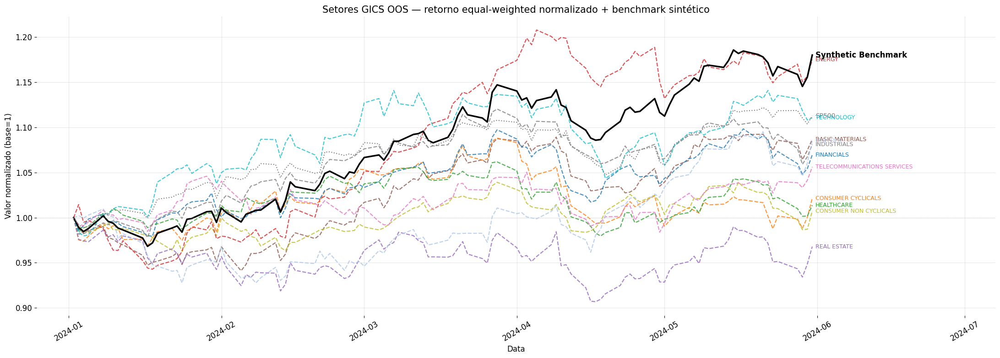

In [4]:
fig, ax = plt.subplots(figsize=(22, 8))
fig.patch.set_facecolor('white'); ax.set_facecolor('white')

for sector in AVAILABLE_SECTORS:
    norm  = sector_oos[sector]['norm']
    color = SECTOR_PALETTE[sector]
    ax.plot(norm.index, norm.values, linewidth=1.6, linestyle='--', color=color, alpha=0.8)
    ax.annotate(sector.replace('_', ' '), xy=(norm.index[-1], norm.iloc[-1]),
                xytext=(5, 0), textcoords='offset points', va='center',
                fontsize=9, color=color)

ax.plot(synth_oos.index, synth_oos.values, linewidth=2.5, color='black')
ax.annotate('Synthetic Benchmark', xy=(synth_oos.index[-1], synth_oos.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center',
            fontsize=12, color='black', fontweight='bold')

ax.plot(sp500_norm.index, sp500_norm.values, linewidth=1.5, color='gray', linestyle=':')
ax.annotate('SP500', xy=(sp500_norm.index[-1], sp500_norm.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center', fontsize=10, color='gray')

ax.axhline(1.0, color='lightgray', linewidth=0.8, linestyle=':')
x_min, x_max = ax.get_xlim()
ax.set_xlim(x_min, x_max + (x_max - x_min) * 0.18)
ax.set_title('Setores GICS OOS — retorno equal-weighted normalizado + benchmark sintético', fontsize=15)
ax.set_xlabel('Data'); ax.set_ylabel('Valor normalizado (base=1)')
ax.tick_params(axis='x', rotation=30)
for sp in ax.spines.values(): sp.set_visible(False)
plt.tight_layout()
plt.savefig(FIG_DIR / 'sectors_overview.pdf', bbox_inches='tight')
plt.show()


**Contexto de mercado (visão geral dos setores OOS)**

O gráfico apresenta a performance normalizada dos 11 setores GICS durante o período out-of-sample. A linha preta sólida (Synthetic Benchmark) é a capitalização da distribuição sintética construída com a mesma formulação usada na otimização,

$$\max_k\Bigl(\mathrm{Tail}_{s/S^k}\bigl(R(I^k)\bigr)\Bigr)$$

aplicada sobre os retornos setoriais OOS, com os retornos implícitos atribuídos às datas por *quantile matching* (o pior retorno sintético cai no pior dia do retorno médio dos setores). A amplitude de dispersão entre os setores revela a heterogeneidade do ambiente OOS: um portfólio bem otimizado deve superar a maioria dos setores individualmente; o Synthetic Benchmark encerra o período próximo do melhor setor — em cada nível de cauda ele adota a exigência do setor mais rigoroso, mas, por ser uma distribuição (e não um envelope de trajetórias), pode ser cruzado pontualmente por setores individuais. Setores abaixo de 1.0 representam perdas absolutas no período e impuseram restrições SSD mais frouxas ao modelo. O SP500 (pontilhado cinza) serve de referência de mercado amplo; quando o Synthetic Benchmark se posiciona nitidamente acima do SP500, o ambiente criado pelos setores foi mais exigente que o mercado como um todo — endurecendo as restrições que o portfólio teve de satisfazer a cada rebalanceamento.

**Fórmula de normalização:**

$$\text{norm}_s(t) = \prod_{i=1}^{t}\bigl(1 + r_{s,i}\bigr) = \frac{P_s(t)}{P_s(0)}, \qquad \tau_{\text{oos}}[s] = \max_k\left(\mathrm{Tail}_{\frac{s}{S^k}}\bigl(R(I^k)\bigr)\right), \quad r^{(s)}_{\text{synth}} = S\,\tau_{\text{oos}}[s] - S\,\tau_{\text{oos}}[s-1]$$

onde $r_{s,i}$ é o retorno equal-weighted do setor $s$ no dia $i$ (média dos retornos de seus constituintes) e $P_s(t)$ seu índice de retorno acumulado. Cada série é rebaseada para 1.0 no primeiro dia OOS; o Synthetic Benchmark capitaliza os retornos implícitos $r^{(s)}_{\text{synth}}$ do envelope de tail expectations, datados por quantile matching contra o retorno médio dos setores.

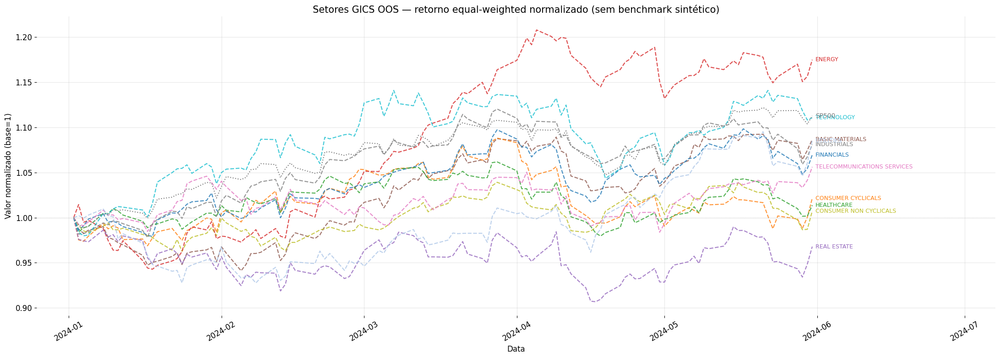

In [5]:
fig, ax = plt.subplots(figsize=(22, 8))
fig.patch.set_facecolor('white'); ax.set_facecolor('white')

for sector in AVAILABLE_SECTORS:
    norm  = sector_oos[sector]['norm']
    color = SECTOR_PALETTE[sector]
    ax.plot(norm.index, norm.values, linewidth=1.6, linestyle='--', color=color, alpha=0.8)
    ax.annotate(sector.replace('_', ' '), xy=(norm.index[-1], norm.iloc[-1]),
                xytext=(5, 0), textcoords='offset points', va='center',
                fontsize=9, color=color)


ax.plot(sp500_norm.index, sp500_norm.values, linewidth=1.5, color='gray', linestyle=':')
ax.annotate('SP500', xy=(sp500_norm.index[-1], sp500_norm.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center', fontsize=10, color='gray')

ax.axhline(1.0, color='lightgray', linewidth=0.8, linestyle=':')
x_min, x_max = ax.get_xlim()
ax.set_xlim(x_min, x_max + (x_max - x_min) * 0.18)
ax.set_title('Setores GICS OOS — retorno equal-weighted normalizado (sem benchmark sintético)', fontsize=15)
ax.set_xlabel('Data'); ax.set_ylabel('Valor normalizado (base=1)')
ax.tick_params(axis='x', rotation=30)
for sp in ax.spines.values(): sp.set_visible(False)
plt.tight_layout()
plt.savefig(FIG_DIR / 'sectors_overview_no_synth.pdf', bbox_inches='tight')
plt.show()


**Contexto de mercado sem o Synthetic Benchmark**

Mesma visão do gráfico anterior, porém sem o envelope sintético: a linha preta dominante é removida para evidenciar a dispersão entre os 11 setores GICS e a posição relativa do SP500 (pontilhado cinza). Sem o envelope, fica mais fácil ler quais setores lideram em cada trecho do período OOS — informação que no gráfico anterior fica visualmente comprimida pela linha preta do Synthetic Benchmark.

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_basic_materials.pdf


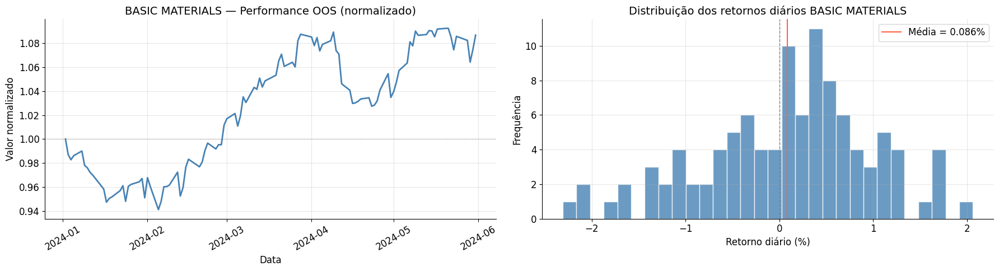

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_consumer_cyclicals.pdf


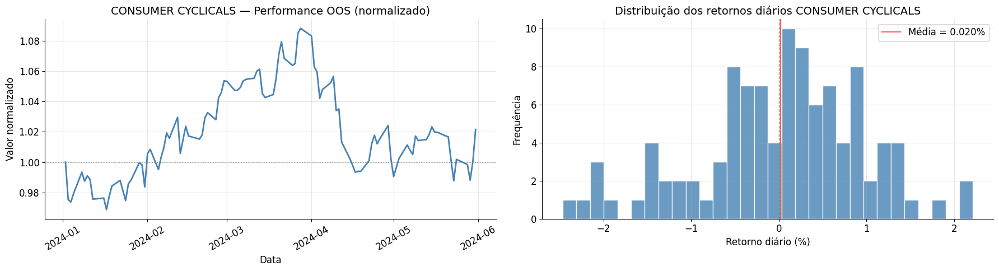

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_consumer_non_cyclicals.pdf


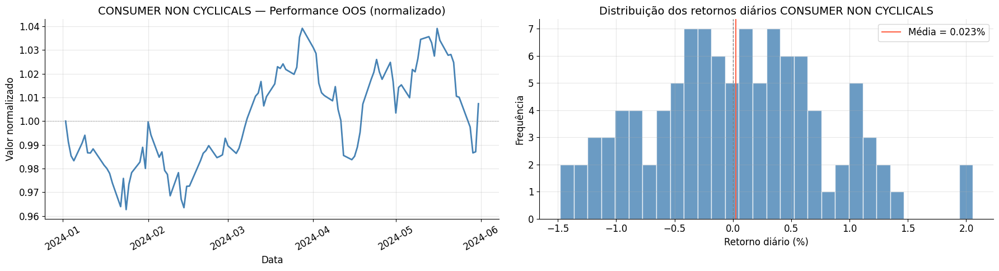

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_energy.pdf


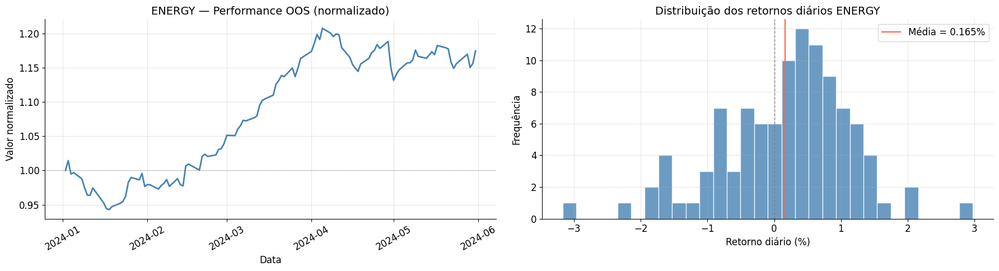

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_financials.pdf


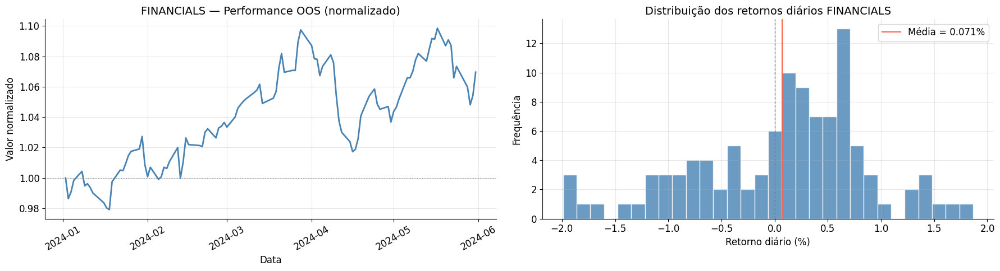

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_healthcare.pdf


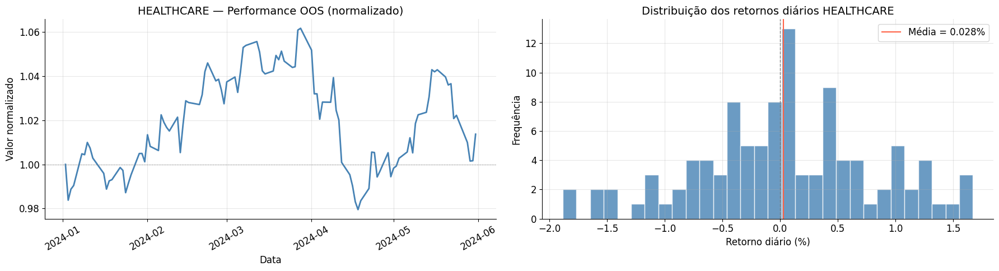

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_industrials.pdf


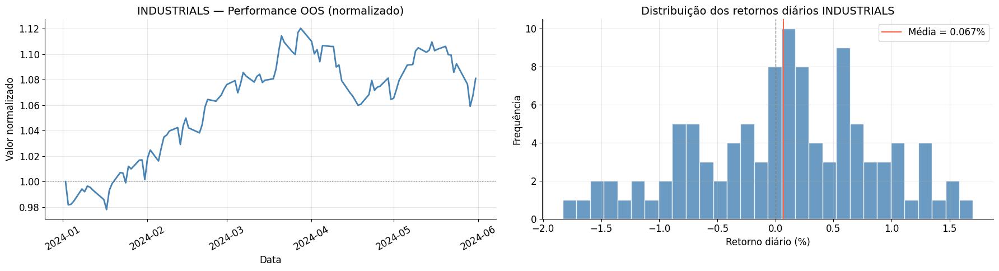

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_real_estate.pdf


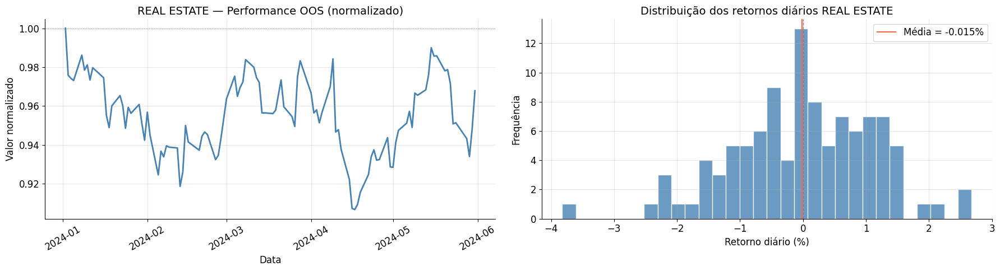

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_technology.pdf


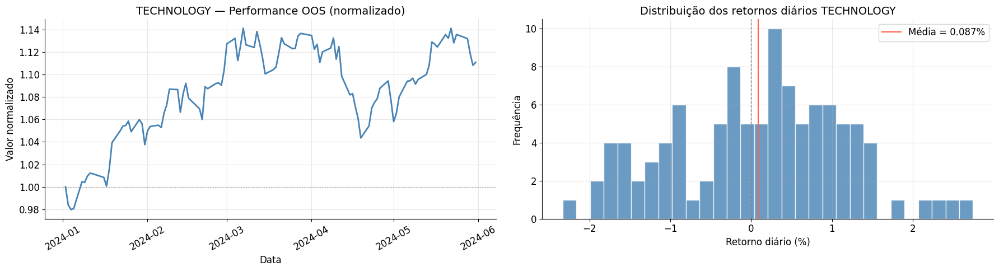

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_telecommunications_services.pdf


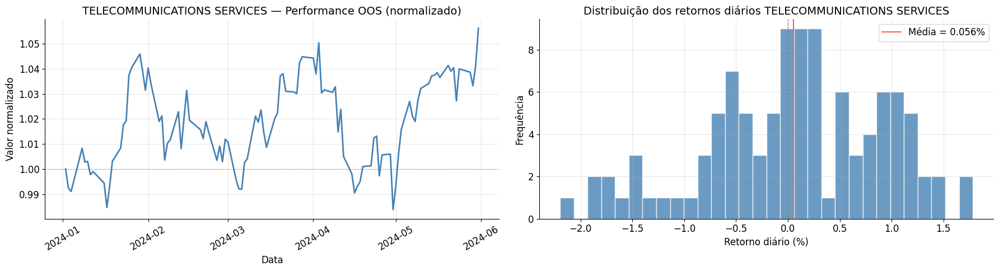

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/market_context_utilities.pdf


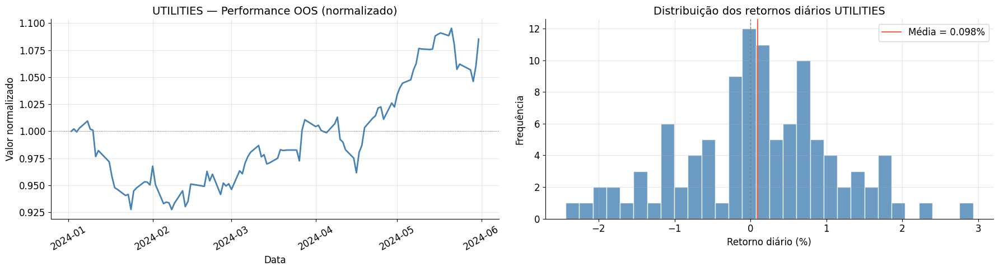

In [6]:
for sector in AVAILABLE_SECTORS:
    plot_market_context(
        sector_oos[sector]['norm'], sector_oos[sector]['ret'],
        benchmark_name=sector.replace('_', ' '),
        save_path=FIG_DIR / f'market_context_{sector.lower()}.pdf',
    )


**Contexto de mercado individual por setor**

Cada painel combina a série normalizada com a distribuição de retornos diários de um setor. Setores com caudas largas nos retornos criam as restrições SSD mais exigentes: o portfólio precisa acumular retornos suficientes mesmo nos piores cenários daquele setor, de modo que a integral cumulativa dos retornos ordenados do portfólio domine a correspondente integral do setor. Setores com tendência positiva acentuada no período OOS são os candidatos mais prováveis a ter sido o binding constraint do Synthetic Benchmark em alguma janela de treino. Setores com retornos persistentemente negativos (série abaixo de 1.0) raramente foram binding — o portfólio os dominou com ampla margem, tornando suas restrições SSD virtualmente inativas durante a otimização.


---
## 3b. Setor dominante por dia OOS

In [7]:
ret_df   = pd.DataFrame({s: sector_oos[s]['ret'] for s in AVAILABLE_SECTORS}).reindex(idx)
dom_day  = ret_df.idxmax(axis=1)

print('Frequência de dominância diária (qual setor tem maior retorno em cada dia OOS):')
for s, n in dom_day.value_counts().items():
    print(f'  {s:<38}  {n:3d} dias  ({n/len(idx)*100:.1f}%)')


Frequência de dominância diária (qual setor tem maior retorno em cada dia OOS):
  ENERGY                                   23 dias  (21.9%)
  TECHNOLOGY                               22 dias  (21.0%)
  UTILITIES                                16 dias  (15.2%)
  CONSUMER_NON_CYCLICALS                    9 dias  (8.6%)
  CONSUMER_CYCLICALS                        8 dias  (7.6%)
  REAL_ESTATE                               8 dias  (7.6%)
  BASIC_MATERIALS                           6 dias  (5.7%)
  FINANCIALS                                5 dias  (4.8%)
  TELECOMMUNICATIONS_SERVICES               4 dias  (3.8%)
  HEALTHCARE                                3 dias  (2.9%)
  INDUSTRIALS                               1 dias  (1.0%)


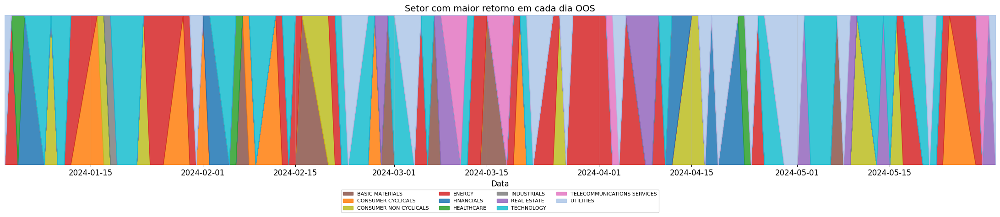

In [8]:
# Stacked area chart showing daily dominance
fig, ax = plt.subplots(figsize=(22, 5))
fig.patch.set_facecolor('white'); ax.set_facecolor('white')

bottom = np.zeros(len(idx))
for sector in AVAILABLE_SECTORS:
    mask = (dom_day == sector).astype(float).values
    ax.fill_between(idx, bottom, bottom + mask,
                    color=SECTOR_PALETTE[sector], alpha=0.85,
                    label=sector.replace('_', ' '))
    bottom += mask

ax.set_xlim(idx[0], idx[-1])
ax.set_ylim(0, 1)
ax.set_yticks([])
ax.set_title('Setor com maior retorno em cada dia OOS', fontsize=14)
ax.set_xlabel('Data')
ax.legend(fontsize=8, ncol=4, loc='upper center', bbox_to_anchor=(0.5, -0.15))
for sp in ax.spines.values(): sp.set_visible(False)
plt.tight_layout()
plt.savefig(FIG_DIR / 'dominant_sector_daily.pdf', bbox_inches='tight')
plt.show()


**Setor dominante por dia OOS**

O gráfico de área empilhada revela qual setor teve o maior retorno em cada dia do período OOS, determinando qual componente "puxou" o Synthetic Benchmark para cima naquela jornada. Quando um único setor domina uma fração extensa do período (bloco de cor uniforme), o Synthetic Benchmark é na prática monosetorial no OOS — e o portfólio foi essencialmente pressionado por aquele benchmark específico. Alta fragmentação de cores indica que a liderança rotaciona entre setores: o Synthetic Benchmark é genuinamente multi-setorial, tornando a dominância SSD mais difícil de garantir em toda a distribuição. Setores com mais de 40% dos dias (conforme impresso na célula anterior) tendem a ser os binding constraints durante o walk-forward. Transições abruptas de setor dominante frequentemente coincidem com eventos de mercado — choques setoriais, rotações de estilo — que o modelo não pôde antecipar in-sample, sendo um ponto de atenção para a robustez OOS.


---
## 4. Benchmark sintético OOS — análise detalhada

O benchmark sintético OOS usa a mesma formulação do in-sample:

$$\tau_{\text{oos}}[s] \;=\; \max_k\Bigl(\mathrm{Tail}_{s/S^k}\bigl(I^k\bigr)\Bigr)$$

calculada sobre os retornos setoriais OOS. Os retornos implícitos — a primeira diferença de $S\cdot\tau$ — são datados por *quantile matching* contra o retorno médio dos setores.

In-sample, $\tau_{\text{synth}}$ e os retornos implícitos por rank são gravados a cada janela de rebalanceamento (arquivos `synthetic_bench-*.csv`).


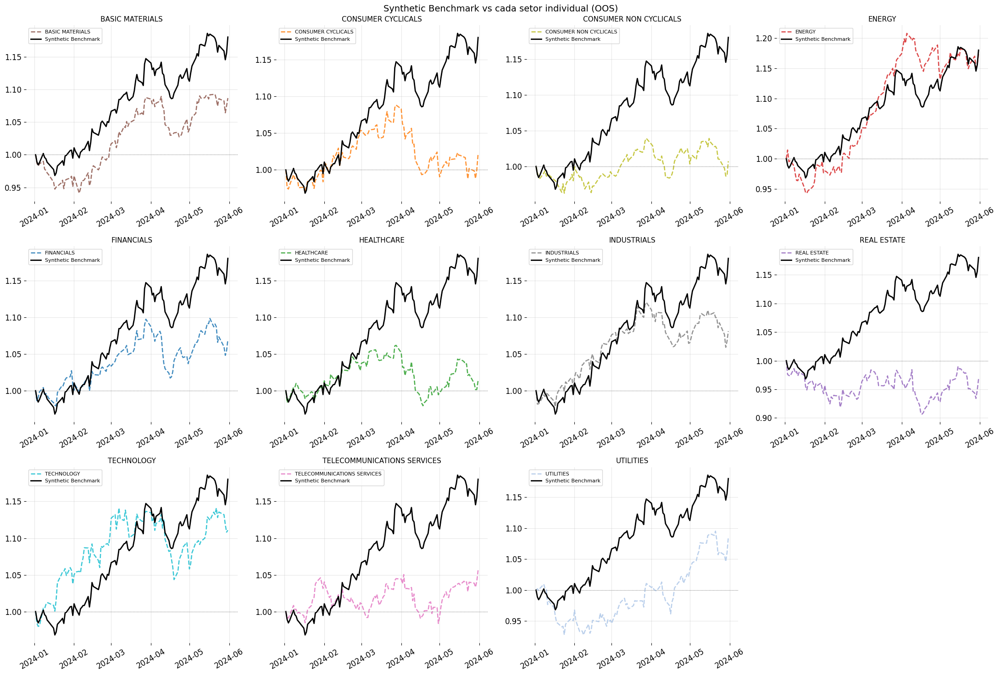

In [9]:
# Synthetic vs each sector (grid 3x4)
n_sectors = len(AVAILABLE_SECTORS)
n_cols_g  = 4
n_rows_g  = (n_sectors + n_cols_g - 1) // n_cols_g

fig, axes = plt.subplots(n_rows_g, n_cols_g, figsize=(22, n_rows_g * 5))
fig.patch.set_facecolor('white')
axes_flat = axes.flatten()

for i, sector in enumerate(AVAILABLE_SECTORS):
    ax = axes_flat[i]; ax.set_facecolor('white')
    norm  = sector_oos[sector]['norm']
    color = SECTOR_PALETTE[sector]
    ax.plot(norm.index, norm.values, color=color, linewidth=1.8, linestyle='--', alpha=0.85,
            label=sector.replace('_', ' '))
    ax.plot(synth_oos.index, synth_oos.values, color='black', linewidth=2.0, label='Synthetic Benchmark')
    ax.axhline(1.0, color='gray', linewidth=0.8, linestyle=':')
    ax.set_title(sector.replace('_', ' '), fontsize=11)
    ax.tick_params(axis='x', rotation=30)
    for sp in ax.spines.values(): sp.set_visible(False)
    ax.legend(fontsize=8)

for ax in axes_flat[n_sectors:]:
    ax.set_visible(False)

plt.suptitle('Synthetic Benchmark vs cada setor individual (OOS)', fontsize=14)
plt.tight_layout()
plt.savefig(FIG_DIR / 'synthetic_vs_sectors.pdf', bbox_inches='tight')
plt.show()


**Synthetic Benchmark vs cada setor individual**

Cada painel torna explícita a "folga" que o modelo precisou cobrir para garantir dominância SSD: a distância vertical entre o Synthetic Benchmark (preto) e o setor individual (colorido) representa o quanto aquele setor ficou abaixo do benchmark sintético em cada instante. Painéis onde o setor cola próximo do Synthetic Benchmark identificam os binding constraints do modelo — setores que frequentemente determinaram o nível da restrição LP e, portanto, mais influenciaram a composição do portfólio. Setores muito abaixo do Synthetic Benchmark raramente foram binding e o modelo os dominou com margem. A forma da curva do Synthetic Benchmark é especialmente informativa: uma trajetória ascendente concentrada nos primeiros dias do OOS implica restrições in-sample calibradas para ganhos iniciais, enquanto uma curva crescente no final indica que o cenário mais exigente se materializou somente no encerramento do período.


5 janelas de treino encontradas



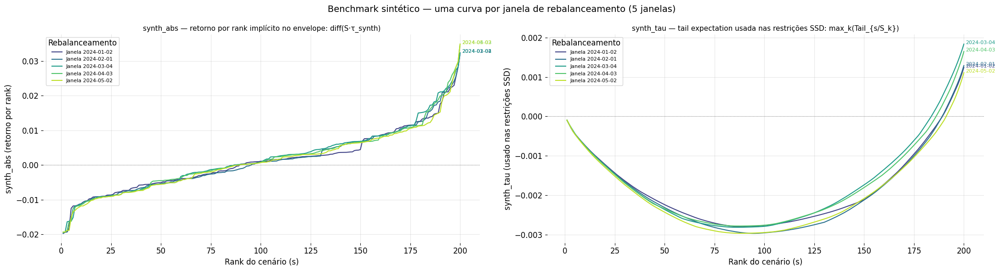

In [10]:
# Per-window synthetic benchmark curves
# Uma curva por JANELA DE REBALANCEAMENTO (são 5), não por setor.
#    As 11 curvas setoriais estão na seção de constraint tightness, mais abaixo.
synth_files = sorted(SECTORS_DIR_OUT.glob('synthetic_bench-*.csv'))
print(f'{len(synth_files)} janelas de treino encontradas\n')

if synth_files:
    fig, axes = plt.subplots(1, 2, figsize=(22, 6))
    fig.patch.set_facecolor('white')
    colors_w = cm.viridis(np.linspace(0.2, 0.9, len(synth_files)))

    for color, f in zip(colors_w, synth_files):
        df   = pd.read_csv(f)
        date = f.stem.replace('synthetic_bench-', '')
        axes[0].plot(df['rank'], df['synth_abs'], linewidth=1.5, color=color,
                     label=f'Janela {date}')
        axes[1].plot(df['rank'], df['synth_tau'], linewidth=1.5, color=color,
                     label=f'Janela {date}')
        axes[0].annotate(date, xy=(df['rank'].iloc[-1], df['synth_abs'].iloc[-1]),
                         xytext=(3,0), textcoords='offset points', fontsize=8, color=color)
        axes[1].annotate(date, xy=(df['rank'].iloc[-1], df['synth_tau'].iloc[-1]),
                         xytext=(3,0), textcoords='offset points', fontsize=8, color=color)

    for ax, ttl, yl in zip(axes,
            ['synth_abs — retorno por rank implícito no envelope: diff(S·τ_synth)',
             'synth_tau — tail expectation usada nas restrições SSD: max_k(Tail_{s/S_k})'],
            ['synth_abs (retorno por rank)', 'synth_tau (usado nas restrições SSD)']):
        ax.axhline(0, color='gray', linewidth=0.8, linestyle=':')
        ax.set_title(ttl, fontsize=11); ax.set_xlabel('Rank do cenário (s)')
        ax.set_ylabel(yl)
        ax.legend(fontsize=8, loc='upper left', title='Rebalanceamento')
        for sp in ax.spines.values(): sp.set_visible(False)

    plt.suptitle('Benchmark sintético — uma curva por janela de rebalanceamento '
                 f'({len(synth_files)} janelas)', fontsize=14)
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'synthetic_bench_windows.pdf', bbox_inches='tight')
    plt.show()
else:
    print('[AVISO]: Nenhum arquivo synthetic_bench-*.csv encontrado. '
          'Execute tafmSSD-sectors.py primeiro.')


**Synthetic Benchmark por janela de rebalanceamento (curvas absolutas e cumulativas)**

> **Leitura da figura.** Cada curva corresponde a **uma janela de rebalanceamento** — são 5, uma
> por data de rebalanceamento — e **não** a um setor. O benchmark sintético de cada janela já é o
> envelope sobre os 11 setores daquela janela; as 11 curvas setoriais que o compõem aparecem
> individualmente na seção *Constraint tightness*, adiante. O rótulo anterior ("sectorial synthetic
> bench") induzia à leitura errada de que cada curva era um setor.

O painel esquerdo (`synth_abs`) mostra o retorno por rank implícito no envelope sintético (primeira diferença do cumulativo $S\cdot\tau_{\text{synth}}$) — do pior ao melhor cenário dentro da janela de treino. O painel direito (`synth_tau`) exibe a esperança incondicional de cauda,

$$\tau_{\text{synth}}[s] \;=\; \max_k\bigl(\mathrm{Tail}_{s/S^k}\bigr),$$

que entra diretamente nas restrições SSD do LP. Curvas muito próximas entre janelas distintas (cores do viridis sobrepostas) indicam que o Synthetic Benchmark é estável ao longo do tempo, o que favorece consistência nas restrições a cada rebalanceamento. O ponto de cruzamento zero em `synth_abs` delimita a fronteira entre cenários de perda e ganho: um cruzamento tardio (muitos ranks negativos) significa que os piores cenários do Synthetic Benchmark concentram perdas significativas, impondo restrições muito exigentes nas caudas negativas. A inclinação de `synth_tau` na região dos piores ranks determina a "dureza" das restrições SSD mais difíceis de satisfazer — janelas com inclinação íngreme forçam o portfólio a manter maior reserva de retornos cumulativos nos cenários de downside. Divergência entre janelas indica períodos de mercado qualitativamente distintos que geraram diferentes estruturas de restrição ao solver.


---
## 5. Constraint tightness — $\tau_k$ por setor por janela de treino

Para cada setor $k$, a esperança incondicional dos $s$ piores retornos é

$$\tau_k[s] \;=\; \mathrm{Tail}_{s/S^k}\bigl(I^k\bigr) \;=\; \frac{1}{S^k}\sum_{i=1}^{s} r^{(i)}_k ,$$

onde $r^{(i)}_k$ é o $i$-ésimo menor retorno do setor $k$ na janela. A restrição binding em cada rank $s$ é a envolvente superior sobre os setores:

$$\tau_{\text{synth}}[s] \;=\; \max_k\bigl(\tau_k[s]\bigr).$$


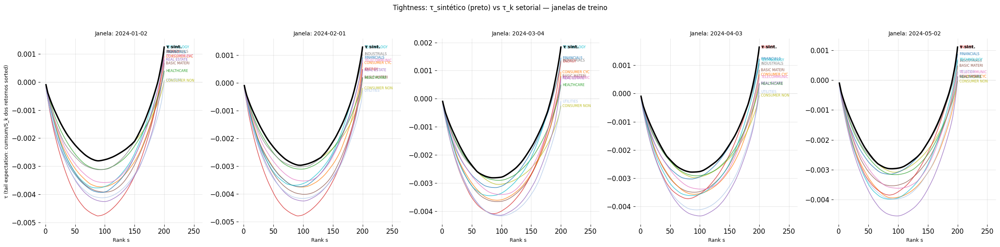

In [11]:
TRAIN_DAYS  = 200

synth_files = sorted(SECTORS_DIR_OUT.glob('synthetic_bench-*.csv'))
n_windows   = len(synth_files)

tau_by_window = {}

if n_windows > 0:
    fig, axes = plt.subplots(1, n_windows, figsize=(5 * n_windows, 6), sharey=False)
    if n_windows == 1:
        axes = [axes]
    fig.patch.set_facecolor('white')

    for ax, f in zip(axes, synth_files):
        date_str = f.stem.replace('synthetic_bench-', '')
        date     = pd.Timestamp(date_str)
        ax.set_facecolor('white')

        loc     = sector_returns.index.get_loc(date)
        train_b = sector_returns.iloc[max(0, loc - TRAIN_DAYS + 1): loc + 1]
        S       = len(train_b)
        ranks   = np.arange(1, S + 1)

        tau_matrix = {}
        for s in AVAILABLE_SECTORS:
            col = train_b[s].dropna()
            if len(col) > 0:
                tau_matrix[s] = np.cumsum(np.sort(col.values)) / len(col)
            else:
                tau_matrix[s] = np.zeros(S)

        tau_by_window[date_str] = tau_matrix
        synth_df = pd.read_csv(f)

        for sector, tau in tau_matrix.items():
            color = SECTOR_PALETTE[sector]
            ax.plot(ranks[:len(tau)], tau, linewidth=1.2, color=color, alpha=0.75)
            ax.annotate(sector.replace('_', ' ')[:12], xy=(ranks[len(tau)-1], tau[-1]),
                        xytext=(3, 0), textcoords='offset points',
                        va='center', fontsize=6, color=color)

        ax.plot(synth_df['rank'], synth_df['synth_tau'],
                linewidth=2.5, color='black', zorder=5)
        ax.annotate('τ sint.', xy=(synth_df['rank'].iloc[-1], synth_df['synth_tau'].iloc[-1]),
                    xytext=(4, 0), textcoords='offset points',
                    va='center', fontsize=8, color='black', fontweight='bold')

        ax.axhline(0, color='lightgray', linewidth=0.8, linestyle=':')
        x_min, x_max = ax.get_xlim()
        ax.set_xlim(x_min, x_max + (x_max - x_min) * 0.25)
        ax.set_title(f'Janela: {date_str}', fontsize=10)
        ax.set_xlabel('Rank s', fontsize=9)
        for sp in ax.spines.values(): sp.set_visible(False)

    axes[0].set_ylabel('τ (tail expectation: cumsum/S_k dos retornos sorted)', fontsize=9)
    fig.suptitle(
        'Tightness: τ_sintético (preto) vs τ_k setorial — janelas de treino',
        fontsize=12, y=1.02,
    )
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'constraint_tightness.pdf', bbox_inches='tight')
    plt.show()
else:
    print('[AVISO]: Execute tafmSSD-sectors.py primeiro.')


**Constraint tightness: $\tau_k$ por setor por janela de treino**

Para cada janela de treino,

$$\tau_k[s] \;=\; \mathrm{Tail}_{s/S^k}\bigl(I^k\bigr) \qquad\text{e}\qquad \tau_{\text{synth}}[s] \;=\; \max_k\bigl(\tau_k[s]\bigr),$$

ou seja: $\tau_k[s]$ é a esperança incondicional dos $s$ piores retornos do setor $k$, e $\tau_{\text{synth}}$ é a envolvente superior que determina as restrições efetivas do LP. Um gap estreito entre $\tau_{\text{synth}}$ e um setor específico indica que aquele setor foi o binding constraint para os ranks correspondentes: pequenas variações em seus retornos mudariam o nível da restrição. A variação do gap ao longo dos ranks revela se um dado setor é binding apenas nas caudas (piores cenários) ou ao longo de toda a distribuição — informação relevante para entender onde o modelo concentrou "esforço" de otimização. $\tau_{\text{synth}}$ assume inevitavelmente valores negativos nos primeiros ranks (média dos piores retornos), mas a magnitude dessa negatividade importa: $\tau_{\text{synth}}$ muito negativo nas caudas torna as restrições SSD dos piores cenários quase intransponíveis sem sacrificar os ranks médios. Variações abruptas de $\tau_{\text{synth}}$ entre janelas consecutivas sinalizam instabilidade nas restrições, o que pode traduzir-se em turnover elevado no portfólio a cada rebalanceamento.


---
## 6. Setor dominante por rank — qual setor é binding em cada rank s?

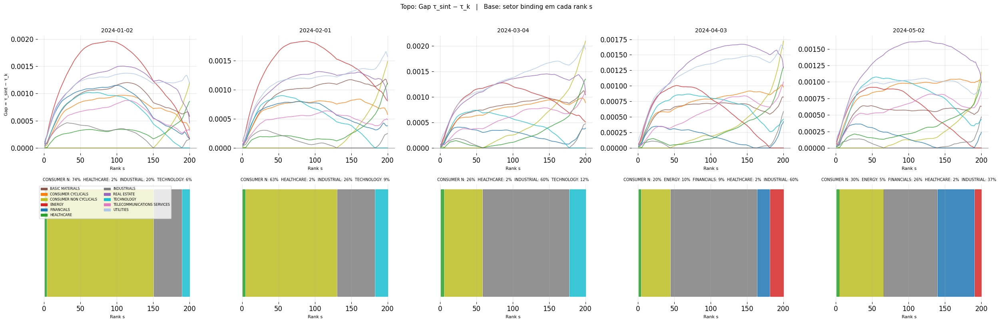

In [12]:
if tau_by_window:
    fig, axes = plt.subplots(2, n_windows, figsize=(5 * n_windows, 8))
    if n_windows == 1:
        axes = axes.reshape(2, 1)
    fig.patch.set_facecolor('white')

    for col_i, (f, date_str) in enumerate(
            [(f, f.stem.replace('synthetic_bench-', '')) for f in synth_files]):

        tau_matrix = tau_by_window[date_str]
        lens = [len(v) for v in tau_matrix.values()]
        S    = min(lens)
        stacked  = np.column_stack([tau_matrix[s][:S] for s in AVAILABLE_SECTORS])
        dom_idx  = np.argmax(stacked, axis=1)
        ranks    = np.arange(1, S + 1)
        synth_v  = stacked[np.arange(S), dom_idx]

        # Top: gap per sector
        ax_top = axes[0, col_i]; ax_top.set_facecolor('white')
        for i, sector in enumerate(AVAILABLE_SECTORS):
            gap = synth_v - stacked[:, i]
            ax_top.plot(ranks, gap, linewidth=1.2, color=SECTOR_PALETTE[sector], alpha=0.8)
        ax_top.axhline(0, color='black', linewidth=0.8, linestyle='-', alpha=0.4)
        ax_top.set_title(date_str, fontsize=10)
        ax_top.set_xlabel('Rank s', fontsize=8)
        if col_i == 0:
            ax_top.set_ylabel('Gap = τ_sint − τ_k', fontsize=8)
        for sp in ax_top.spines.values(): sp.set_visible(False)

        # Bottom: color strip
        ax_bot = axes[1, col_i]; ax_bot.set_facecolor('white')
        for i, sector in enumerate(AVAILABLE_SECTORS):
            mask = (dom_idx == i)
            ax_bot.fill_between(ranks, 0, 1, where=mask,
                                color=SECTOR_PALETTE[sector], alpha=0.85)
        cnt     = Counter(int(j) for j in dom_idx)
        summary = '  '.join(
            f'{AVAILABLE_SECTORS[k].replace("_"," ")[:10]}: {cnt[k]/S*100:.0f}%'
            for k in sorted(cnt) if cnt[k] > 0
        )
        ax_bot.set_title(summary, fontsize=7)
        ax_bot.set_xlabel('Rank s', fontsize=8)
        ax_bot.set_yticks([])
        for sp in ax_bot.spines.values(): sp.set_visible(False)

    # Legend on first bottom panel
    from matplotlib.patches import Patch
    legend_patches = [Patch(color=SECTOR_PALETTE[s], label=s.replace('_', ' '))
                      for s in AVAILABLE_SECTORS]
    axes[1, 0].legend(handles=legend_patches, fontsize=6, loc='upper left', ncol=2)

    fig.suptitle(
        'Topo: Gap τ_sint − τ_k   |   Base: setor binding em cada rank s',
        fontsize=11, y=1.01,
    )
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'constraint_dominance_by_rank.pdf', bbox_inches='tight')
    plt.show()


**Setor dominante por rank s (qual setor é binding em cada rank)**

O painel superior (gap $\tau_{\text{synth}} - \tau_k$) e o painel inferior (setor binding em cada rank) revelam a estrutura interna do Synthetic Benchmark em cada janela de treino. Quando o painel de cores inferior exibe um único setor dominando a maioria dos ranks (blocos largos de uma única cor), o Synthetic Benchmark é efetivamente uni-setorial para aquela janela — equivalendo, na prática, a otimizar contra aquele setor isolado. Alta fragmentação indica um Synthetic Benchmark genuinamente multi-setorial: o portfólio deve simultaneamente se defender dos piores cenários de um setor e dos melhores cenários de outro, tornando o problema de otimização mais complexo. Quando múltiplos setores competem pela posição binding no mesmo rank (gap pequeno em vários setores simultaneamente), o Synthetic Benchmark é especialmente "difícil" naquela região da distribuição. Por fim, a variação do setor dominante entre janelas consecutivas explica mudanças abruptas na composição do portfólio: ao rebalancear, o solver está reagindo a uma estrutura de restrições qualitativamente diferente.


In [13]:
# Resumo numérico do setor binding por janela — sustenta a leitura da figura acima
if tau_by_window:
    binding_rows = {}
    for date_str, tau_matrix in tau_by_window.items():
        S       = min(len(v) for v in tau_matrix.values())
        stacked = np.column_stack([tau_matrix[s][:S] for s in AVAILABLE_SECTORS])
        dom_idx = np.argmax(stacked, axis=1)
        share   = {AVAILABLE_SECTORS[i]: (dom_idx == i).sum() / S * 100
                   for i in range(len(AVAILABLE_SECTORS))}
        binding_rows[date_str] = share

    binding_df = pd.DataFrame(binding_rows).T
    binding_df.index.name = 'Janela'
    binding_df = binding_df.loc[:, binding_df.max() > 0]          # só setores que chegam a ser binding
    binding_df['n_setores_binding'] = (binding_df > 0).sum(axis=1)

    print('Percentual de ranks s em que cada setor é binding (argmax de τ), por janela:\n')
    display(
        binding_df.style
        .background_gradient(cmap='Blues', subset=binding_df.columns[:-1])
        .format('{:.1f}', subset=binding_df.columns[:-1])
        .format('{:.0f}', subset=['n_setores_binding'])
    )

    n_dom = int(binding_df['n_setores_binding'].max())
    setores_ativos = [c for c in binding_df.columns[:-1]]
    print(f'\nSetores que chegam a ser binding em alguma janela: {len(setores_ativos)} '
          f'de {len(AVAILABLE_SECTORS)} → {", ".join(s.replace("_", " ").title() for s in setores_ativos)}')
    print(f'Máximo de setores binding numa mesma janela: {n_dom}')


Percentual de ranks s em que cada setor é binding (argmax de τ), por janela:



,CONSUMER_NON_CYCLICALS,ENERGY,FINANCIALS,HEALTHCARE,INDUSTRIALS,TECHNOLOGY,n_setores_binding
Janela,,,,,,,
2024-01-02,73.5,0.0,0.0,1.5,19.5,5.5,4
2024-02-01,63.0,0.0,0.0,2.0,26.0,9.0,4
2024-03-04,26.5,0.0,0.0,2.5,59.5,11.5,4
2024-04-03,20.0,9.5,9.0,2.0,59.5,0.0,5
2024-05-02,30.5,5.0,25.5,2.0,37.0,0.0,5



Setores que chegam a ser binding em alguma janela: 6 de 11 → Consumer Non Cyclicals, Energy, Financials, Healthcare, Industrials, Technology
Máximo de setores binding numa mesma janela: 5


**Setor binding por rank — resumo numérico**

A tabela quantifica o que a faixa de cores mostra: em que fração dos ranks $s$ cada setor é o
$\arg\max_k \mathrm{Tail}_{s/S^k}$, janela a janela. É a evidência direta de que o benchmark
sintético **não colapsa para um único setor** — ele troca de setor conforme a região da
distribuição, exatamente o comportamento que justifica a construção sintética. Se um único setor
aparecesse com ~100% em todas as janelas, o modelo seria equivalente a otimizar contra aquele
setor isolado e a formulação multi-benchmark perderia o propósito. A coluna
`n_setores_binding` conta quantos setores participam efetivamente do envelope em cada janela.


---
### Benchmark sintético vs. ENERGY — verificação de coincidência

O setor **Energy** tem a distribuição mais assimétrica do painel,
e a hipótese levantada foi que o benchmark sintético estaria *quase sempre* colado nele, podendo
até coincidir. Se coincidisse, o envelope sintético seria redundante — bastaria otimizar contra
Energy. Os dois painéis abaixo testam isso diretamente: à esquerda, $\tau_{\text{synth}}$ contra
$\tau_{\text{ENERGY}}$ rank a rank em cada janela de treino; à direita, as séries normalizadas
out-of-sample. O gap $\tau_{\text{synth}} - \tau_{\text{ENERGY}} \geq 0$ por construção; ser
identicamente zero significa coincidência exata.


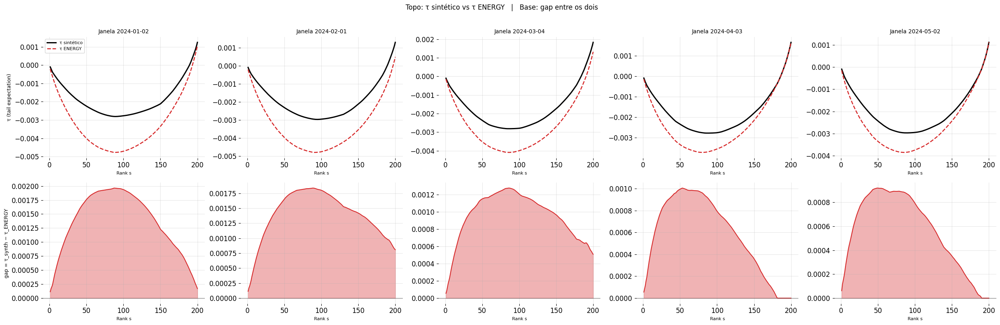

,% ranks ENERGY binding,gap médio,gap máximo,coincide (gap≈0)
Janela,,,,
2024-01-02,0.0,1.363e-03,1.964e-03,False
2024-02-01,0.0,1.398e-03,1.837e-03,False
2024-03-04,0.0,9.550e-04,1.278e-03,False
2024-04-03,9.5,5.841e-04,1.006e-03,False
2024-05-02,5.0,5.638e-04,9.194e-04,False



O sintético coincide exatamente com ENERGY em todas as janelas? NÃO
ENERGY é binding, em média, em 2.9% dos ranks.


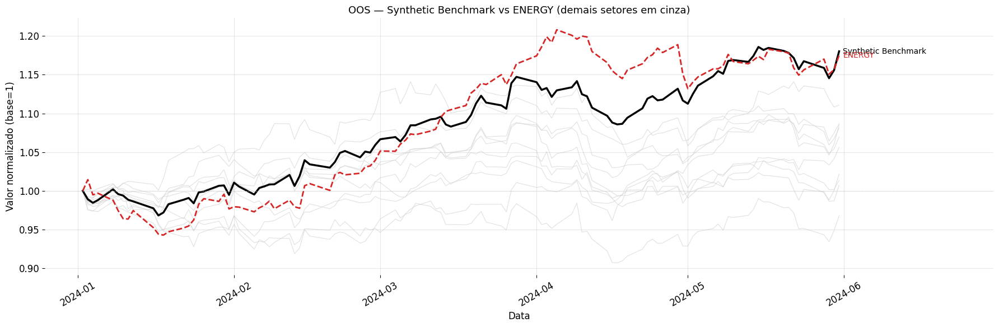

Correlação OOS entre retornos do sintético e de ENERGY: 0.5569


In [14]:
# Sintético vs ENERGY — o sintético colapsa para o setor mais assimétrico?
ENERGY = 'ENERGY'

if tau_by_window and ENERGY in AVAILABLE_SECTORS:
    n_w = len(tau_by_window)
    fig, axes = plt.subplots(2, n_w, figsize=(5 * n_w, 8), squeeze=False)
    fig.patch.set_facecolor('white')

    energy_summary = {}

    for col_i, (date_str, tau_matrix) in enumerate(tau_by_window.items()):
        S        = min(len(v) for v in tau_matrix.values())
        stacked  = np.column_stack([tau_matrix[s][:S] for s in AVAILABLE_SECTORS])
        dom_idx  = np.argmax(stacked, axis=1)
        tau_syn  = stacked[np.arange(S), dom_idx]
        tau_ene  = tau_matrix[ENERGY][:S]
        gap      = tau_syn - tau_ene
        ranks    = np.arange(1, S + 1)
        i_energy = AVAILABLE_SECTORS.index(ENERGY)

        # Topo: as duas curvas τ
        ax = axes[0, col_i]; ax.set_facecolor('white')
        ax.plot(ranks, tau_syn, linewidth=2.2, color='black', label='τ sintético')
        ax.plot(ranks, tau_ene, linewidth=1.8, color=SECTOR_PALETTE[ENERGY],
                linestyle='--', label='τ ENERGY')
        ax.set_title(f'Janela {date_str}', fontsize=10)
        ax.set_xlabel('Rank s', fontsize=8)
        if col_i == 0:
            ax.set_ylabel('τ (tail expectation)', fontsize=9)
            ax.legend(fontsize=8, loc='upper left')
        for sp in ax.spines.values(): sp.set_visible(False)

        # Base: gap
        ax = axes[1, col_i]; ax.set_facecolor('white')
        ax.fill_between(ranks, 0, gap, color=SECTOR_PALETTE[ENERGY], alpha=0.35)
        ax.plot(ranks, gap, linewidth=1.4, color=SECTOR_PALETTE[ENERGY])
        ax.axhline(0, color='black', linewidth=0.8, alpha=0.5)
        ax.set_xlabel('Rank s', fontsize=8)
        if col_i == 0:
            ax.set_ylabel('gap = τ_synth − τ_ENERGY', fontsize=9)
        for sp in ax.spines.values(): sp.set_visible(False)

        energy_summary[date_str] = {
            '% ranks ENERGY binding': (dom_idx == i_energy).sum() / S * 100,
            'gap médio':              gap.mean(),
            'gap máximo':             gap.max(),
            'coincide (gap≈0)':       bool(np.allclose(gap, 0.0, atol=1e-12)),
        }

    fig.suptitle('Topo: τ sintético vs τ ENERGY   |   Base: gap entre os dois',
                 fontsize=12, y=1.01)
    plt.tight_layout()
    plt.savefig(FIG_DIR / 'synthetic_vs_energy.pdf', bbox_inches='tight')
    plt.show()

    energy_df = pd.DataFrame(energy_summary).T
    energy_df.index.name = 'Janela'
    display(energy_df.style.format({'% ranks ENERGY binding': '{:.1f}',
                                    'gap médio': '{:.3e}', 'gap máximo': '{:.3e}'}))

    coincide_all = energy_df['coincide (gap≈0)'].all()
    print(f'\nO sintético coincide exatamente com ENERGY em todas as janelas? '
          f'{"SIM" if coincide_all else "NÃO"}')
    print(f'ENERGY é binding, em média, em {energy_df["% ranks ENERGY binding"].mean():.1f}% dos ranks.')

# ── OOS: séries normalizadas ───────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(18, 6))
fig.patch.set_facecolor('white'); ax.set_facecolor('white')

ax.plot(synth_oos.index, synth_oos.values, linewidth=2.5, color='black')
ax.annotate('Synthetic Benchmark', xy=(synth_oos.index[-1], synth_oos.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center', fontsize=10, color='black')

energy_norm = sector_oos[ENERGY]['norm'].reindex(idx)
ax.plot(energy_norm.index, energy_norm.values, linewidth=2.0,
        color=SECTOR_PALETTE[ENERGY], linestyle='--')
ax.annotate('ENERGY', xy=(energy_norm.index[-1], energy_norm.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center',
            fontsize=10, color=SECTOR_PALETTE[ENERGY])

for sector in AVAILABLE_SECTORS:
    if sector == ENERGY:
        continue
    norm = sector_oos[sector]['norm'].reindex(idx)
    ax.plot(norm.index, norm.values, linewidth=0.8, color='lightgray', alpha=0.7, zorder=1)

ax.axhline(1.0, color='lightgray', linewidth=0.8, linestyle=':')
x_min, x_max = ax.get_xlim()
ax.set_xlim(x_min, x_max + (x_max - x_min) * 0.14)
ax.set_title('OOS — Synthetic Benchmark vs ENERGY (demais setores em cinza)', fontsize=13)
ax.set_xlabel('Data'); ax.set_ylabel('Valor normalizado (base=1)')
ax.tick_params(axis='x', rotation=30)
for sp in ax.spines.values(): sp.set_visible(False)
plt.tight_layout()
plt.savefig(FIG_DIR / 'synthetic_vs_energy_oos.pdf', bbox_inches='tight')
plt.show()

corr_se = np.corrcoef(synth_oos.reindex(idx).pct_change().dropna(),
                      energy_norm.pct_change().dropna())[0, 1]
print(f'Correlação OOS entre retornos do sintético e de ENERGY: {corr_se:.4f}')


**Sintético × ENERGY — leitura**

Duas conclusões possíveis, e a figura decide qual vale. Se o gap for identicamente nulo em todas as
janelas e ENERGY for binding em 100% dos ranks, o benchmark sintético degenera para um único setor
— e a construção multi-benchmark não estaria agregando nada sobre otimizar diretamente contra
Energy. Se o gap for positivo em faixas relevantes de rank, o envelope é genuinamente multi-setorial:
Energy domina onde sua assimetria manda (tipicamente a cauda inferior, onde ele impõe a restrição
mais exigente), mas cede a posição binding a outros setores no miolo e na cauda superior da
distribuição. O painel OOS complementa o diagnóstico in-sample: proximidade das trajetórias
normalizadas não implica coincidência das restrições, já que $\tau$ é construído sobre a
distribuição ordenada, não sobre a cronologia.


---
## 7. Visão geral — portfólio vs setores

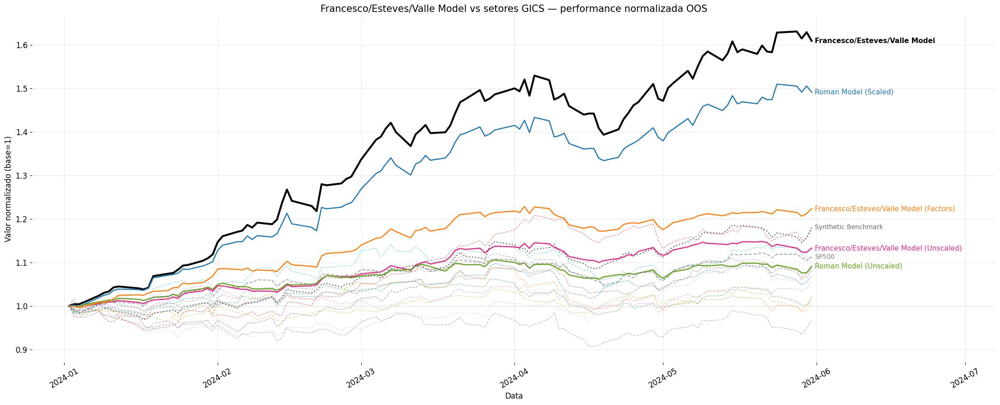

In [15]:
MODEL_COLORS = {
    'Francesco/Esteves/Valle Model': '#000000',
    'Roman Model (Scaled)':          '#1f77b4',
    'Francesco/Esteves/Valle Model (Factors)': '#ff7f0e',
    'Francesco/Esteves/Valle Model (Unscaled)': '#e7298a',
    'Roman Model (Unscaled)':                   '#66a61e',
}

fig, ax = plt.subplots(figsize=(22, 9))
fig.patch.set_facecolor('white'); ax.set_facecolor('white')

# Sector benchmarks (background, dashed)
for sector in AVAILABLE_SECTORS:
    norm  = sector_oos[sector]['norm']
    color = SECTOR_PALETTE[sector]
    ax.plot(norm.index, norm.values, linewidth=1.0, linestyle='--', color=color, alpha=0.5)

# Synthetic benchmark
ax.plot(synth_oos.index, synth_oos.values, linewidth=1.8, color='dimgray', linestyle=':')
ax.annotate('Synthetic Benchmark', xy=(synth_oos.index[-1], synth_oos.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center',
            fontsize=10, color='dimgray')

# Portfolio models (foreground, solid)
for label, series in models.items():
    color = MODEL_COLORS.get(label, '#999999')
    lw    = 3.0 if label == 'Francesco/Esteves/Valle Model' else 1.8
    ax.plot(idx, series.values, linewidth=lw, color=color, linestyle='-')
    ax.annotate(label, xy=(idx[-1], series.iloc[-1]),
                xytext=(5, 0), textcoords='offset points', va='center',
                fontsize=11, color=color,
                fontweight='bold' if label == 'Francesco/Esteves/Valle Model' else 'normal')

# SP500
ax.plot(sp500_norm.index, sp500_norm.values, linewidth=1.4, color='gray', linestyle='--', alpha=0.7)
ax.annotate('SP500', xy=(sp500_norm.index[-1], sp500_norm.iloc[-1]),
            xytext=(5, 0), textcoords='offset points', va='center',
            fontsize=10, color='gray')

ax.axhline(1.0, color='lightgray', linewidth=0.8, linestyle=':')
x_min, x_max = ax.get_xlim()
ax.set_xlim(x_min, x_max + (x_max - x_min) * 0.18)
ax.set_title('Francesco/Esteves/Valle Model vs setores GICS — performance normalizada OOS', fontsize=15)
ax.set_xlabel('Data'); ax.set_ylabel('Valor normalizado (base=1)')
ax.tick_params(axis='x', rotation=30)
for sp in ax.spines.values(): sp.set_visible(False)
plt.tight_layout()
plt.savefig(FIG_DIR / 'all_models_comparison.pdf', bbox_inches='tight')
plt.show()


**Visão geral: portfólio vs setores GICS**

Este gráfico consolida a performance normalizada do Francesco/Esteves/Valle Model (linha preta espessa) em relação a todos os 11 setores e ao Synthetic Benchmark, sendo a visualização mais importante do experimento. A posição relativa do portfólio em relação ao conjunto de setores é a evidência primária da validade OOS do modelo: uma trajetória consistentemente acima da mediana setorial confirma que a dominância SSD in-sample transferiu-se para o período de teste. A distância entre o portfólio e o Synthetic Benchmark (teto teórico) mede o custo combinado de diversificação e satisfação simultânea de todas as restrições SSD — um gap inevitável na abordagem multi-benchmark. A comparação com o Roman Model (Scaled) e o FEV Model (Factors) permite isolar o efeito da escolha de benchmark: diferenças significativas entre os três portfólios indicam que o tipo de benchmark altera substancialmente o processo de otimização e os pesos resultantes, enquanto trajetórias similares sugerem robustez da abordagem SSD independentemente do benchmark escolhido.


---
## 8. Drawdown comparativo

### Definição de drawdown

O drawdown é medido sobre a série de riqueza **normalizada** $W_t$ (base 1 no início do OOS),
como a queda relativa em relação ao pico corrente:

$$DD_t \;=\; \frac{W_t - \max_{u \le t} W_u}{\max_{u \le t} W_u}$$

e o **máximo drawdown** é $\mathrm{MDD} = \min_t DD_t$, um número **negativo**: quanto mais
próximo de zero, melhor. A função `compute_drawdown` abaixo implementa exatamente essa expressão
(`series.expanding().max()` é o $\max_{u\le t} W_u$), e `compute_metrics` usa a mesma definição
via `series.cummax()` — as duas são consistentes entre si.

O painel foi refeito em relação à v1: os dois gráficos agora compartilham a escala do eixo $y$,
o que permite comparar diretamente a profundidade das quedas dos setores e dos portfólios, e o
ponto de máximo drawdown de cada série do painel inferior é marcado explicitamente.


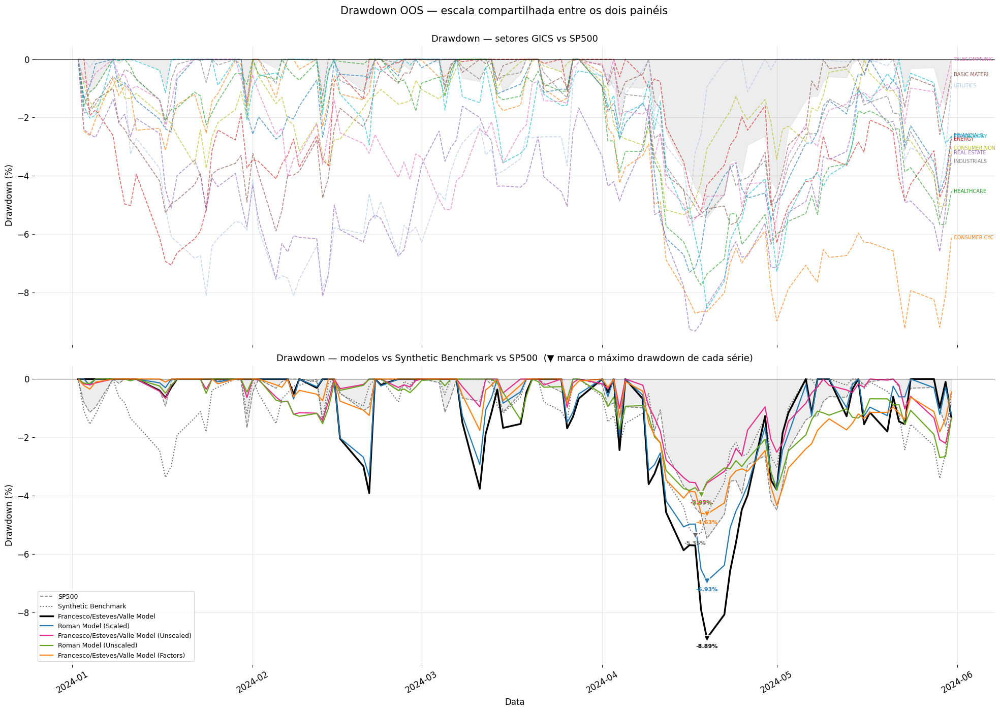

Máximo drawdown OOS (menos negativo = melhor):

  Francesco/Esteves/Valle Model (Unscaled)         -3.95%
  Roman Model (Unscaled)                           -3.97%
  Francesco/Esteves/Valle Model (Factors)          -4.63%
  Synthetic Benchmark                              -5.35%
  Roman Model (Scaled)                             -6.93%
  Francesco/Esteves/Valle Model                    -8.89%


In [16]:
def compute_drawdown(series):
    """DD_t = (W_t - max_{u<=t} W_u) / max_{u<=t} W_u, em %."""
    roll_max = series.expanding().max()
    return (series / roll_max - 1) * 100

sp500_dd = compute_drawdown(sp500_norm)

# sharey=True: as duas escalas passam a ser comparáveis entre si
fig, axes = plt.subplots(2, 1, figsize=(20, 14), sharex=True, sharey=True)
fig.patch.set_facecolor('white')

# Panel 1: sector benchmarks drawdown
ax1 = axes[0]; ax1.set_facecolor('white')
ax1.fill_between(idx, sp500_dd.values, 0, color='lightgray', alpha=0.4, label='SP500')
for sector in AVAILABLE_SECTORS:
    norm  = sector_oos[sector]['norm'].reindex(idx)
    dd    = compute_drawdown(norm)
    ax1.plot(idx, dd.values, linewidth=1.2, linestyle='--',
             color=SECTOR_PALETTE[sector], alpha=0.7)
    ax1.annotate(sector.replace('_', ' ')[:12], xy=(idx[-1], dd.iloc[-1]),
                 xytext=(3, 0), textcoords='offset points', va='center',
                 fontsize=7, color=SECTOR_PALETTE[sector])
ax1.axhline(0, color='black', linewidth=0.6)
ax1.set_title('Drawdown — setores GICS vs SP500', fontsize=13)
ax1.set_ylabel('Drawdown (%)')
for sp in ax1.spines.values(): sp.set_visible(False)

# Panel 2: portfolio drawdown
ax2 = axes[1]; ax2.set_facecolor('white')
ax2.fill_between(idx, sp500_dd.values, 0, color='lightgray', alpha=0.4)
ax2.plot(idx, sp500_dd.values, color='gray', linewidth=1.2, linestyle='--', label='SP500')

dd_series = {'Synthetic Benchmark': compute_drawdown(synth_oos.reindex(idx))}
dd_colors = {'Synthetic Benchmark': 'dimgray'}
ax2.plot(idx, dd_series['Synthetic Benchmark'].values, linewidth=1.5,
         linestyle=':', color='dimgray', label='Synthetic Benchmark')

for label, series in models.items():
    color = MODEL_COLORS.get(label, '#999999')
    lw    = 2.5 if label == 'Francesco/Esteves/Valle Model' else 1.6
    dd    = compute_drawdown(series.reindex(idx))
    dd_series[label] = dd
    dd_colors[label] = color
    ax2.plot(idx, dd.values, linewidth=lw, color=color, label=label)

# marca o ponto de máximo drawdown de cada série
for label, dd in dd_series.items():
    t_min = dd.idxmin()
    ax2.plot([t_min], [dd.loc[t_min]], marker='v', markersize=9,
             color=dd_colors[label], markeredgecolor='white', markeredgewidth=1.0, zorder=8)
    ax2.annotate(f'{dd.loc[t_min]:.2f}%', xy=(t_min, dd.loc[t_min]),
                 xytext=(0, -14), textcoords='offset points', ha='center',
                 fontsize=8, color=dd_colors[label], fontweight='bold')

ax2.axhline(0, color='black', linewidth=0.6)
ax2.set_title('Drawdown — modelos vs Synthetic Benchmark vs SP500  '
              '(▼ marca o máximo drawdown de cada série)', fontsize=13)
ax2.set_ylabel('Drawdown (%)'); ax2.set_xlabel('Data')
ax2.legend(fontsize=9, loc='lower left')
ax2.tick_params(axis='x', rotation=30)
for sp in ax2.spines.values(): sp.set_visible(False)

plt.suptitle('Drawdown OOS — escala compartilhada entre os dois painéis', fontsize=15, y=1.00)
plt.tight_layout()
plt.savefig(FIG_DIR / 'drawdown_comparison.pdf', bbox_inches='tight')
plt.show()

# Ranking numérico de máximo drawdown (menos negativo = melhor)
mdd = pd.Series({k: v.min() for k, v in dd_series.items()}).sort_values(ascending=False)
print('Máximo drawdown OOS (menos negativo = melhor):\n')
for k, v in mdd.items():
    print(f'  {k:<45} {v:>8.2f}%')


**Drawdown comparativo**

O painel superior mostra o drawdown dos 11 setores GICS contra o SP500; o inferior, o dos modelos.
Com a escala do eixo $y$ agora compartilhada, a comparação entre os dois é direta: dá para ver de
imediato se o portfólio otimizado sofre quedas da mesma ordem de grandeza que os setores que compõem
seu benchmark, ou se a otimização SSD efetivamente amortece as caudas. Os marcadores ▼ indicam o
instante e a profundidade do máximo drawdown de cada série — o valor que aparece na coluna
`Max Drawdown (%)` da tabela de métricas.

A leitura relevante é a *forma* da recuperação, não só a profundidade: dois portfólios com o mesmo
máximo drawdown são bem diferentes se um recupera o pico em poucos dias e o outro permanece
submerso por semanas. Restrições SSD atuam sobre a distribuição não condicional dos retornos e não
impõem nada sobre a ordem temporal, então nada garante recuperação rápida — o drawdown é justamente
a métrica que expõe essa dimensão que o critério de otimização não controla.


---
## 9. Métricas OOS — tabela completa

### Métricas — definições

Todas as métricas partem da série de riqueza normalizada $W_t$ (base 1) e dos retornos diários
$r_t = W_t/W_{t-1} - 1$, com $T$ observações e $r_f$ a taxa livre de risco anual.

| Métrica | Fórmula |
|---|---|
| **CAGR** | $\left(\dfrac{W_T}{W_0}\right)^{252/T} - 1$ — taxa geométrica de crescimento, equivalente à média geométrica anualizada dos retornos |
| **Mean return** | $\bar{r} \cdot 252$ — média aritmética anualizada; é o **numerador comum** de Sharpe e Sortino |
| **Volatility** | $\sigma(r) \cdot \sqrt{252}$ |
| **Semi-volatility** | $\sqrt{\mathbb{E}\left[\min(r_t, 0)^2\right]} \cdot \sqrt{252}$ — semidesvio abaixo do alvo zero, penaliza só o downside |
| **Sharpe** | $\dfrac{\bar{r}\cdot 252 - r_f}{\sigma(r)\sqrt{252}}$ |
| **Sortino** | $\dfrac{\bar{r}\cdot 252 - r_f}{\text{semi-volatility}}$ — mesmo numerador do Sharpe, risco medido só no downside |
| **Calmar** | $\dfrac{\text{CAGR}}{\lvert \mathrm{MDD}\rvert}$ — retorno por unidade de perda máxima |
| **Daily CVaR 5%** | $\mathbb{E}\left[r_t \mid r_t \le q_{0.05}(r)\right]$, reportado como perda positiva |
| **Max Drawdown** | $\min_t DD_t$ (definição da seção anterior), **negativo** |
| **Beta** | $\dfrac{\mathrm{Cov}(r, r_{\text{SP500}})}{\mathrm{Var}(r_{\text{SP500}})}$ — sempre **contra o SP500** |

**O que mudou em relação à v1:**

1. **Sharpe e Sortino agora compartilham o numerador.** Na v1 o Sharpe usava a média aritmética dos
   retornos e o Sortino usava o CAGR — grandezas diferentes, o que tornava os dois índices não
   comparáveis entre si. A coluna `Mean return (%)` explicita esse numerador comum.
2. **Semi-volatilidade propriamente dita.** A v1 usava o desvio padrão dos retornos negativos; agora
   é o semidesvio $\sqrt{\mathbb{E}[\min(r,0)^2]}$, com os quadrados dos shortfalls promediados
   sobre *todos* os cenários. Isso a torna diretamente comparável à volatilidade cheia — e é a
   medida adequada para distribuições assimétricas, como as dos setores analisados aqui.
3. **Cores do Max Drawdown corrigidas.** Na v1 a coluna entrava no mesmo gradiente invertido de
   volatilidade e CVaR. Como o Max Drawdown é negativo, isso pintava de verde o pior valor
   (o mais negativo) e de vermelho o melhor. Agora usa o gradiente direto.
4. **Dominância estocástica como número**, não só como figura — colunas descritas abaixo.

**Colunas de dominância (vs. Synthetic Benchmark).** Com $r_{P,(s)}$ e $r_{B,(s)}$ os retornos
ordenados do portfólio e do benchmark,

$$\mathrm{SSD}_s \;=\; \sum_{z\le s}\left(r_{P,(z)} - r_{B,(z)}\right):$$

- `min SSD` — o valor mínimo da curva SSD. Se $\ge 0$, há **dominância estocástica de segunda ordem**.
- `% ranks SSD≥0` — fração dos ranks em que a condição é satisfeita; 100% ⟺ dominância plena.
- `Área violação` — $\frac{1}{S}\sum_s \min(\mathrm{SSD}_s, 0)$, magnitude média da violação.
  Zero ⟺ dominância; quanto mais negativo, mais longe de dominar.


In [17]:
rows = {}
rows['SP500']     = compute_metrics(sp500_norm, benchmark=sp500_norm, rf_annual=RISK_FREE)
rows['Synthetic Benchmark'] = compute_metrics(synth_oos,  benchmark=sp500_norm, rf_annual=RISK_FREE)

for label, series in models.items():
    rows[label] = compute_metrics(series.reindex(idx), benchmark=sp500_norm, rf_annual=RISK_FREE)

for sector in AVAILABLE_SECTORS:
    norm = sector_oos[sector]['norm'].reindex(idx)
    rows[sector.replace('_', ' ')] = compute_metrics(norm, benchmark=sp500_norm, rf_annual=RISK_FREE)

metrics_df = pd.DataFrame(rows).T
metrics_df = metrics_df.rename(columns={'Portfolio beta': 'Beta vs SP500'})   # rótulo explícito


# Dominância estocástica como número, referência comum = Synthetic Benchmark
def ssd_summary(series, bench_series):
    r_p = series.pct_change().dropna().values
    r_b = bench_series.pct_change().dropna().values
    n   = min(len(r_p), len(r_b))
    if n < 2:
        return {'min SSD': np.nan, '% ranks SSD>=0': np.nan, 'Área violação': np.nan}
    _, _, ssd = compute_ssd_dominance(r_p[:n], r_b[:n])
    return {
        'min SSD':         float(ssd.min()),
        '% ranks SSD>=0':  float((ssd >= 0).mean() * 100),
        'Área violação':   float(np.minimum(ssd, 0.0).mean()),
    }


synth_ref = synth_oos.reindex(idx)
dom_rows  = {'SP500': ssd_summary(sp500_norm, synth_ref),
             'Synthetic Benchmark': ssd_summary(synth_ref, synth_ref)}
for label, series in models.items():
    dom_rows[label] = ssd_summary(series.reindex(idx), synth_ref)
for sector in AVAILABLE_SECTORS:
    dom_rows[sector.replace('_', ' ')] = ssd_summary(sector_oos[sector]['norm'].reindex(idx), synth_ref)

metrics_df = metrics_df.join(pd.DataFrame(dom_rows).T)

# Max Drawdown sai do gradiente invertido: é negativo, o maior valor é o melhor
render_heat(
    metrics_df.style
    .background_gradient(cmap='RdYlGn',
        subset=['Final value', 'CAGR (%)', 'Mean return (%)',
                'Sharpe Ratio', 'Sortino Ratio', 'Calmar Ratio',
                'Max Drawdown (%)', 'min SSD', '% ranks SSD>=0', 'Área violação'])
    .background_gradient(cmap='RdYlGn_r',
        subset=['Volatility (%)', 'Semi-volatility (%)', 'Daily CVaR 5% (%)'])
    .format(precision=4, na_rep='--')
    .format('{:.3e}', subset=['min SSD', 'Área violação'])
    .format('{:.1f}', subset=['% ranks SSD>=0'])
)


,Final value,CAGR (%),Mean return (%),Volatility (%),Semi-volatility (%),Daily CVaR 5% (%),Sharpe Ratio,Sortino Ratio,Calmar Ratio,Max Drawdown (%),Beta vs SP500,min SSD,% ranks SSD>=0,Área violação
SP500,1.1127,29.5400,26.5300,11.3400,7.1200,1.4070,1.8990,3.0252,5.4062,-5.4600,1.0000,-6.024e-02,69.2,-5.042e-03
Synthetic Benchmark,1.1802,49.3900,41.1300,13.9100,7.9700,1.3310,2.5979,4.5333,9.2329,-5.3500,0.9013,0.000e+00,100.0,0.000e+00
Francesco/Esteves/Valle Model,1.6089,216.5500,117.9000,22.0700,12.0900,2.3830,5.1149,9.3418,24.3688,-8.8900,1.1691,-1.158e-01,50.0,-3.645e-02
Roman Model (Scaled),1.4911,163.2900,98.6400,18.2900,9.7600,1.9300,5.1194,9.5920,23.5625,-6.9300,1.0043,-5.157e-02,63.5,-1.304e-02
Francesco/Esteves/Valle Model (Unscaled),1.1327,35.2400,30.5800,8.6200,5.0400,0.9490,2.9685,5.0751,8.9150,-3.9500,0.5443,-4.355e-02,94.2,-9.998e-04
Roman Model (Unscaled),1.0907,23.4100,21.3700,8.0700,5.0500,0.9700,2.0292,3.2414,5.9008,-3.9700,0.4801,-8.155e-02,88.5,-4.101e-03
Francesco/Esteves/Valle Model (Factors),1.2230,62.8800,49.3500,10.2900,5.7100,1.1700,4.3107,7.7708,13.5732,-4.6300,0.6071,1.545e-03,100.0,0.000e+00
BASIC MATERIALS,1.0867,22.3300,21.2000,14.4600,10.1100,1.9300,1.1205,1.6014,3.7919,-5.8900,0.7860,-8.226e-02,0.0,-4.891e-02
CONSUMER CYCLICALS,1.0215,5.3000,6.3400,15.3700,11.3000,2.1660,0.0871,0.1184,0.5743,-9.2300,1.0009,-1.436e-01,0.0,-9.472e-02
CONSUMER NON CYCLICALS,1.0073,1.7900,2.4500,11.7300,7.9800,1.3310,-0.2173,-0.3191,0.3350,-5.3400,0.3211,-1.596e-01,41.3,-4.005e-02


**Métricas OOS (tabela completa)**

As colunas de retorno, os índices ajustados ao risco e o drawdown estão definidos na seção anterior.
Duas leituras interessam em particular:

**Volatilidade vs. semi-volatilidade.** Os modelos mais rentáveis carregam, como esperado, mais
risco total. A comparação entre as duas colunas é o que separa risco de *perda* de mera oscilação:
uma série com volatilidade alta mas semi-volatilidade proporcionalmente baixa está oscilando
sobretudo para cima — assimetria favorável, que a volatilidade cheia penaliza indevidamente. É por
isso que o Sortino, que compartilha o numerador com o Sharpe e só troca o denominador, tende a
separar melhor os modelos aqui do que o Sharpe.

**Dominância vs. Synthetic Benchmark.** A restrição SSD é imposta *in-sample*, sobre a janela de
treino; estas colunas medem se ela se sustenta *out-of-sample*, onde não há garantia teórica. Uma
série com `% ranks SSD≥0` igual a 100% domina o benchmark sintético no período OOS. Valores
intermediários com `Área violação` próxima de zero indicam violações marginais, concentradas em
poucos ranks — situação materialmente diferente de uma violação profunda e sistemática.


---
## 10. Dominância SSD

Francesco/Esteves/Valle Model vs Synthetic Benchmark: min(SSD) = -0.115770  ✗ VIOLA 
Roman Model (Scaled) vs SP500: min(SSD) = -0.074537  ✗ VIOLA 
Francesco/Esteves/Valle Model (Unscaled) vs Synthetic Benchmark: min(SSD) = -0.043552  ✗ VIOLA 
Roman Model (Unscaled) vs SP500: min(SSD) = -0.021319  ✗ VIOLA 
Francesco/Esteves/Valle Model (Factors) vs SP500: min(SSD) = +0.002830  ✓ DOMINA


[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/ssd_home_dominance.pdf


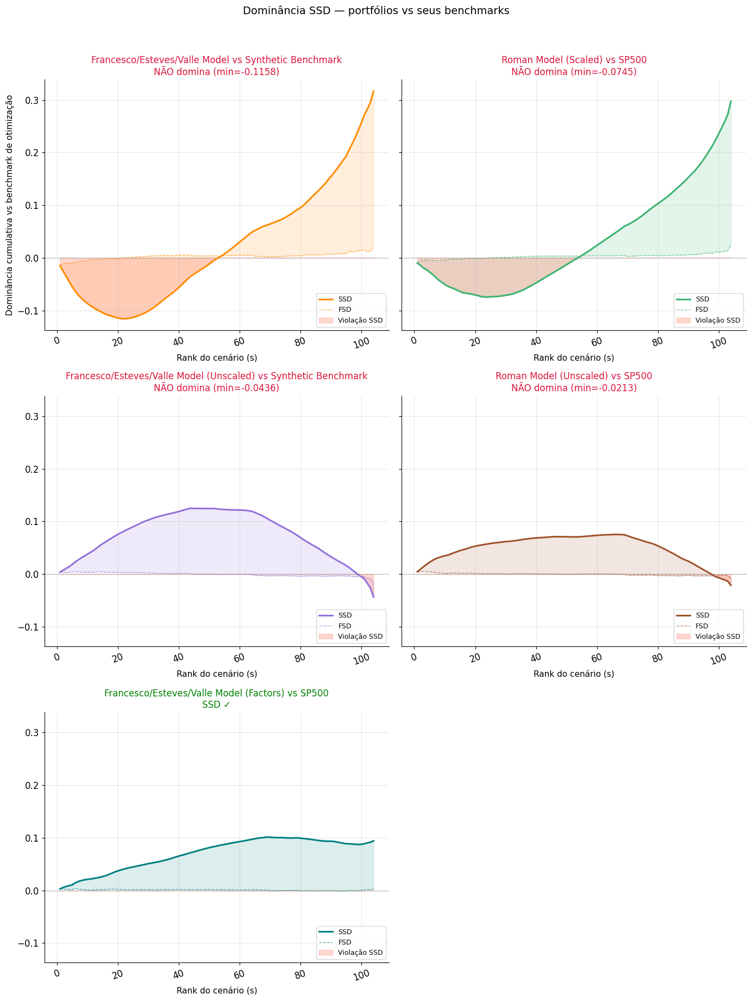

In [18]:
# Home dominance: cada portfólio vs o benchmark contra o qual foi otimizado.
# Os dois modelos setoriais (scaled e unscaled) são otimizados contra o benchmark
# sintético; os demais, contra o SP500.
synth_ret_full = synth_oos.pct_change().dropna()

HOME_BENCH = {
    'Francesco/Esteves/Valle Model':            (synth_ret_full, 'Synthetic Benchmark'),
    'Francesco/Esteves/Valle Model (Unscaled)': (synth_ret_full, 'Synthetic Benchmark'),
}

home_dom = {}
for label, series in models.items():
    bench_ret, bench_name = HOME_BENCH.get(label, (sp500_ret, 'SP500'))
    r_port  = series.reindex(idx).pct_change().dropna()
    r_bench = bench_ret.reindex(r_port.index).dropna()
    common  = r_port.index.intersection(r_bench.index)
    s, fsd, ssd = compute_ssd_dominance(r_port.loc[common].values, r_bench.loc[common].values)
    home_dom[f'{label} vs {bench_name}'] = (s, fsd, ssd)
    tag = '✓ DOMINA' if ssd.min() >= 0 else '✗ VIOLA '
    print(f'{label} vs {bench_name}: min(SSD) = {ssd.min():+.6f}  {tag}')

plot_dominance_panels(
    home_dom, n_cols=2,
    benchmark_name='benchmark de otimização',
    title='Dominância SSD — portfólios vs seus benchmarks',
    save_path=FIG_DIR / 'ssd_home_dominance.pdf',
)


**Dominância SSD: portfólios vs seus benchmarks de otimização**

Este painel verifica se cada portfólio domina SSD o seu benchmark de otimização no período OOS. A dominância SSD in-sample é garantida pelo LP — o teste aqui é a generalização. Para o Francesco/Esteves/Valle Model, a curva SSD deve estar ≥ 0 em todos os pontos para confirmar dominância OOS contra o Synthetic Benchmark setorial; violações (regiões negativas) localizam exatamente onde o benchmark superou o portfólio na distribuição acumulada. Violações nas caudas esquerdas (piores cenários) são as mais preocupantes, pois indicam que o portfólio perdeu mais do que o benchmark nos piores dias OOS — contrariando o objetivo fundamental da formulação. Violações leves (min SSD próximo de zero) são aceitáveis dado o gap temporal entre in-sample e OOS. A comparação com o Roman Model (Scaled) vs SP500 fornece o baseline: se o modelo setorial apresenta dominância OOS similar ou melhor que o Roman Model, o uso de benchmarks setoriais agrega valor sem deteriorar a propriedade de dominância.



=== Francesco/Esteves/Valle Model: dominância cruzada vs cada setor ===
  Setor                                     min(SSD)    min(FSD)  Status
  ------------------------------------------------------------------------
  BASIC_MATERIALS                          -0.057552   -0.006333  ✗ VIOLA 
  CONSUMER_CYCLICALS                       -0.026649   -0.004765  ✗ VIOLA 
  CONSUMER_NON_CYCLICALS                   -0.115770   -0.014613  ✗ VIOLA 
  ENERGY                                   -0.047126   -0.005627  ✗ VIOLA 
  FINANCIALS                               -0.078432   -0.009530  ✗ VIOLA 
  HEALTHCARE                               -0.100124   -0.010578  ✗ VIOLA 
  INDUSTRIALS                              -0.100464   -0.011128  ✗ VIOLA 
  REAL_ESTATE                              +0.000250   -0.002238  ✓ DOMINA
  TECHNOLOGY                               -0.035246   -0.006119  ✗ VIOLA 
  TELECOMMUNICATIONS_SERVICES              -0.072064   -0.007440  ✗ VIOLA 
  UTILITIES                  

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/ssd_cross_dominance_sectors.pdf


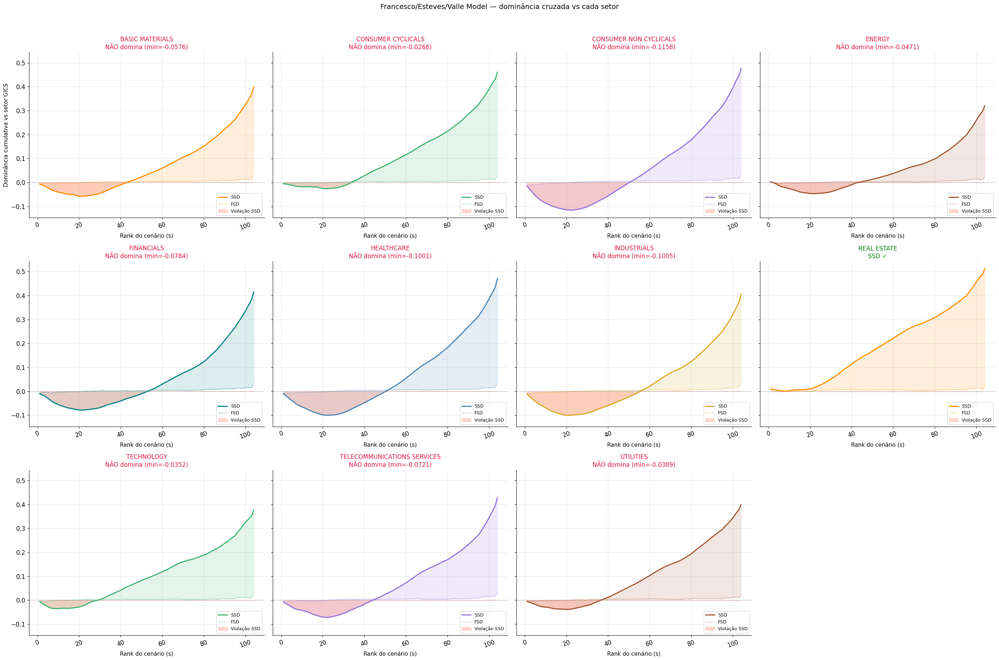

In [19]:
# Cross-dominance: Francesco/Esteves/Valle Model vs each sector benchmark
if 'Francesco/Esteves/Valle Model' in models:
    port_ret  = models['Francesco/Esteves/Valle Model'].reindex(idx).pct_change().dropna()
    cross_dom = {}

    print(f'\n=== Francesco/Esteves/Valle Model: dominância cruzada vs cada setor ===')
    print(f'  {"Setor":<38}  {"min(SSD)":>10}  {"min(FSD)":>10}  Status')
    print('  ' + '-' * 72)

    for sector in AVAILABLE_SECTORS:
        bench_ret = sector_oos[sector]['ret'].reindex(port_ret.index).dropna()
        common    = port_ret.index.intersection(bench_ret.index)
        s, fsd, ssd = compute_ssd_dominance(
            port_ret.loc[common].values, bench_ret.loc[common].values
        )
        cross_dom[sector.replace('_', ' ')] = (s, fsd, ssd)
        tag = '✓ DOMINA' if ssd.min() >= 0 else '✗ VIOLA '
        print(f'  {sector:<38}  {ssd.min():+10.6f}  {fsd.min():+10.6f}  {tag}')

    plot_dominance_panels(
        cross_dom, n_cols=4,
        benchmark_name='setor GICS',
        title='Francesco/Esteves/Valle Model — dominância cruzada vs cada setor',
        save_path=FIG_DIR / 'ssd_cross_dominance_sectors.pdf',
    )


**Dominância cruzada: Francesco/Esteves/Valle Model vs cada setor individualmente**

A dominância cruzada é a verificação mais reveladora sobre a generalidade do modelo. Se o portfólio domina SSD cada um dos 11 setores separadamente — incluindo setores que não foram o binding constraint durante a otimização — isso confirma que o Synthetic Benchmark impõe restrições suficientemente rígidas para garantir dominância generalizada. Não dominar todos os setores é esperado e aceitável: o modelo foi otimizado para dominar o envelope de tail expectations, e um setor específico pode superar esse envelope em distribuição por desvios de curto prazo não capturáveis in-sample. O resultado mais informativo é a comparação do min(SSD) entre setores: setores com violação mais severa foram os mais difíceis de dominar OOS e são candidatos naturais a benchmarks problemáticos para o período subsequente. A correlação entre os setores não dominados aqui e os setores que dominaram mais dias no gráfico de frequência (seção 3b) confirma a coerência da análise — os setores com melhor performance OOS são os mais difíceis de dominar SSD.


---
## 10b. Dominância SSD — CDFs e integrais cumulativas (grade scaled × unscaled)

Para cada modelo da grade 2×2, compara-se $F(x)$ (CDF do portfólio) com $G(x)$ (CDF do benchmark
contra o qual ele foi otimizado — sintético setorial para os modelos deste trabalho, SP500 para os
de Roma):

- **Verde**: $G \ge F$ → o portfólio domina nessa região
- **Rosa**: $G < F$ → o benchmark domina nessa região
- **$I_2(x)$**: integral acumulada à esquerda de $G-F$. A condição de dominância de segunda ordem é

$$I_2(x) \;=\; \int_{-\infty}^{x}\bigl[G(u) - F(u)\bigr]\,du \;\ge\; 0 \quad \forall x .$$


In [20]:
def plot_cdf_dominance(r_port, r_bench, port_name='Portfolio', bench_name='Synthetic Benchmark',
                       save_path=None):
    n_pts  = 1000
    lo     = min(r_port.min(), r_bench.min()) - 0.002
    hi     = max(r_port.max(), r_bench.max()) + 0.002
    x_grid = np.linspace(lo, hi, n_pts)
    dx     = x_grid[1] - x_grid[0]

    F = np.array([np.mean(r_port  <= x) for x in x_grid])
    G = np.array([np.mean(r_bench <= x) for x in x_grid])

    diff = G - F
    I2   = np.cumsum(diff) * dx   # SSD: running left integral (I₂ ≥ 0 everywhere ⟺ SSD)

    fig, (ax_cdf, ax_diff) = plt.subplots(1, 2, figsize=(18, 6))
    fig.patch.set_facecolor('white')

    # ── Left: CDFs ─────────────────────────────────────────────────────────────
    ax_cdf.set_facecolor('white')
    ax_cdf.step(x_grid, F, color='#ff7f0e', linewidth=2,
                label=f'F(x) — {port_name}', where='post')
    ax_cdf.step(x_grid, G, color='black', linewidth=2, linestyle='--',
                label=f'G(x) — {bench_name}', where='post')
    ax_cdf.fill_between(x_grid, F, G, where=(G >= F), alpha=0.25, color='#2ca02c',
                         label='G≥F: portfólio domina', step='post')
    ax_cdf.fill_between(x_grid, F, G, where=(G <  F), alpha=0.25, color='#d62728',
                         label='G<F: benchmark domina', step='post')
    ax_cdf.set_ylim(0, 1.05)
    ax_cdf.set_xlabel('Retorno diário x', fontsize=11)
    ax_cdf.set_ylabel('P(retorno ≤ x)', fontsize=11)
    ax_cdf.set_title(f'F (portfólio) vs G ({bench_name})', fontsize=12)
    ax_cdf.legend(fontsize=9, loc='upper left')
    for sp in ax_cdf.spines.values(): sp.set_visible(False)

    # ── Right: G-F + SSD integral ──────────────────────────────────────────────
    ax_diff.set_facecolor('white')
    ax_diff.step(x_grid, diff, color='black', linewidth=1.5,
                 label='G(x)−F(x)', where='post', zorder=3)
    ax_diff.fill_between(x_grid, diff, 0, where=(diff >= 0), alpha=0.25,
                          color='#2ca02c', step='post', label='G−F ≥ 0')
    ax_diff.fill_between(x_grid, diff, 0, where=(diff <  0), alpha=0.25,
                          color='#d62728', step='post', label='G−F < 0')
    ax_diff.axhline(0, color='black', linewidth=0.4, alpha=0.3)
    ax_diff.set_xlabel('Retorno diário x', fontsize=11)
    ax_diff.set_ylabel('G(x) − F(x)', fontsize=11)
    ax_diff.set_title('G(x)−F(x) e integral acumulada I₂(x)', fontsize=12)
    for sp in ax_diff.spines.values(): sp.set_visible(False)

    ax2 = ax_diff.twinx()
    ax2.plot(x_grid, I2, color='steelblue', linewidth=2, linestyle='--',
             label='I₂(x) — condição SSD (∫ esq.)')
    ax2.axhline(0, color='lightgray', linewidth=0.5)
    ax2.set_ylabel('I₂(x) — integral acumulada', fontsize=9)
    for sp in ax2.spines.values(): sp.set_visible(False)

    lines1, labels1 = ax_diff.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax_diff.legend(lines1 + lines2, labels1 + labels2, fontsize=8, loc='lower right')

    plt.suptitle(f'{port_name} vs {bench_name} — análise CDF e dominância SSD',
                 fontsize=13, y=1.02)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()

    return float(I2.min())


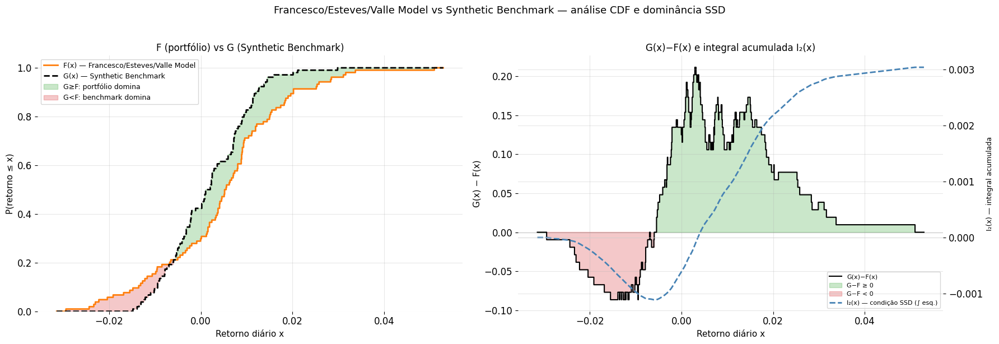

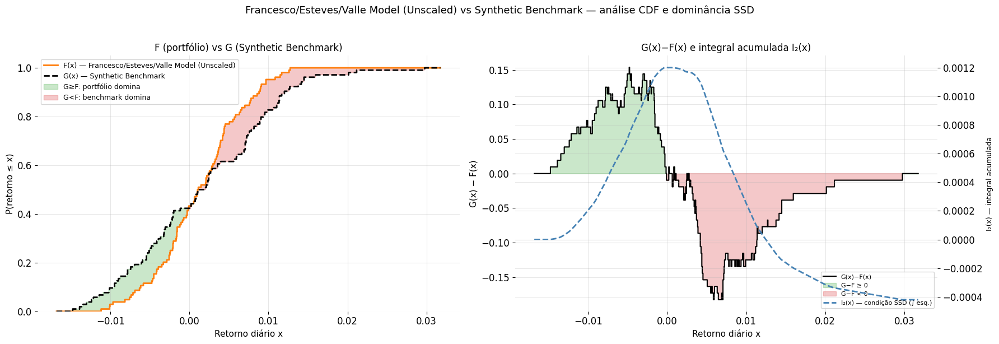

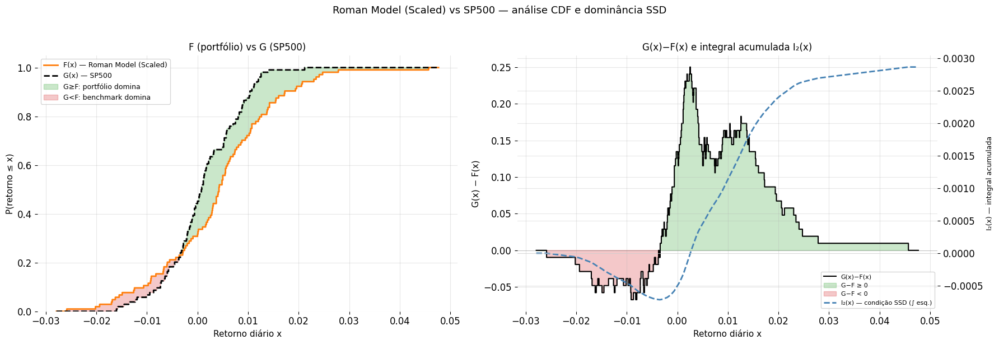

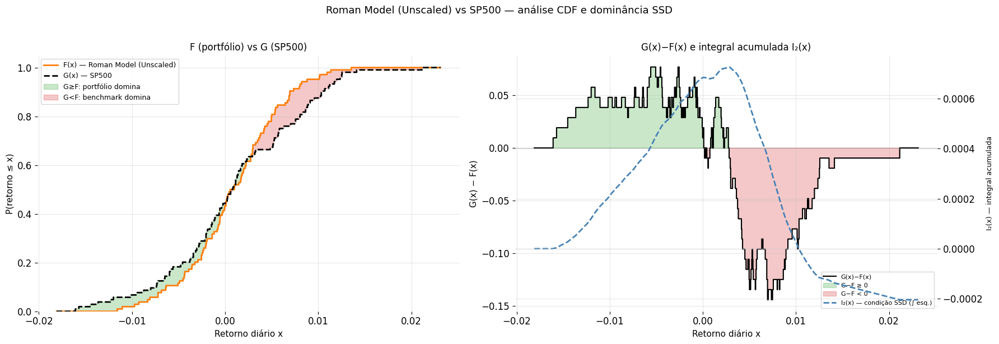


min I₂(x) — negativo indica onde a dominância SSD não se transferiu para o OOS:
  Francesco/Esteves/Valle Model vs Synthetic Benchmark       -1.113e-03  ✗ viola
  Francesco/Esteves/Valle Model (Unscaled) vs Synthetic Benchmark -4.199e-04  ✗ viola
  Roman Model (Scaled) vs SP500                              -7.150e-04  ✗ viola
  Roman Model (Unscaled) vs SP500                            -2.040e-04  ✗ viola


In [21]:
# CDF + integral SSD para cada modelo da grade, contra o seu próprio benchmark
CDF_GRID = [
    ('Francesco/Esteves/Valle Model',            'Synthetic Benchmark', 'cdf_dominance_fev_model.pdf'),
    ('Francesco/Esteves/Valle Model (Unscaled)', 'Synthetic Benchmark', 'cdf_dominance_fev_model_unscaled.pdf'),
    ('Roman Model (Scaled)',                     'SP500',               'cdf_dominance_roman_scaled.pdf'),
    ('Roman Model (Unscaled)',                   'SP500',               'cdf_dominance_roman_unscaled.pdf'),
]
BENCH_RET = {'Synthetic Benchmark': synth_oos.pct_change().dropna(),
             'SP500':               sp500_ret.dropna()}

cdf_summary = {}
for label, bench_name, fname in CDF_GRID:
    if label not in models:
        print(f'[AVISO] modelo ausente: {label}')
        continue
    r_p    = models[label].reindex(idx).pct_change().dropna()
    r_b    = BENCH_RET[bench_name].reindex(r_p.index).dropna()
    common = r_p.index.intersection(r_b.index)

    I2min = plot_cdf_dominance(
        r_p.loc[common].values, r_b.loc[common].values,
        port_name=label, bench_name=bench_name,
        save_path=FIG_DIR / fname,
    )
    cdf_summary[f'{label} vs {bench_name}'] = I2min

print('\nmin I₂(x) — negativo indica onde a dominância SSD não se transferiu para o OOS:')
for k, v in cdf_summary.items():
    print(f'  {k:<58} {v:+.3e}  {"✓ SSD" if v >= 0 else "✗ viola"}')


**CDFs e integral SSD — os quatro modelos da grade**

O painel esquerdo de cada figura sobrepõe as CDFs empíricas do portfólio, $F(x)$, e do seu benchmark,
$G(x)$. Verde marca $G \ge F$ (o portfólio tem menor probabilidade de ficar abaixo de $x$ — vantagem
do portfólio naquela faixa) e rosa marca $G < F$. O painel direito mostra $G-F$ e a integral
acumulada $I_2(x)$, cuja não-negatividade em todo $x$ é condição necessária e suficiente para
dominância SSD.

**O eixo scaled/unscaled inverte o formato da curva — e o tipo de falha.**

| | onde o portfólio leva vantagem | onde $I_2$ atinge o mínimo | min $I_2$ |
|---|---|---|---|
| FEV Model (scaled) | cauda **direita** (ganhos) | cauda **esquerda** | $-1{,}11\times10^{-3}$ |
| FEV Model (unscaled) | cauda **esquerda** (perdas) | extremo **direito** | $-4{,}20\times10^{-4}$ |
| Roman (scaled) | cauda **direita** | cauda **esquerda** | $-7{,}15\times10^{-4}$ |
| Roman (unscaled) | cauda **esquerda** | extremo **direito** | $-2{,}04\times10^{-4}$ |

Os modelos *scaled* são rosa à esquerda e verdes à direita: perdem para o benchmark na região de
perdas e ganham na de ganhos. Os *unscaled* fazem o oposto. É a mesma dicotomia observada na
seção 14d — o *scaled* concentra em ativos agressivos, o *unscaled* diversifica e protege o
downside — vista agora na distribuição inteira, e não apenas em estatísticas resumidas.

**Atenção ao comparar os `min` $I_2$ entre as duas famílias: eles medem falhas de natureza
diferente.** Como $I_2(x) \to \mathbb{E}[r_P] - \mathbb{E}[r_B]$ quando $x \to +\infty$, o valor no
extremo direito é simplesmente a diferença de retorno médio. Nos modelos *unscaled* o mínimo de
$I_2$ está exatamente aí: a violação diz que **o portfólio rende menos que o benchmark em média**
(1,133 contra 1,180 do sintético; 1,091 contra 1,113 do SP500), e não que ele seja arriscado. Nos
*scaled* o mínimo está na cauda esquerda — violação de **proteção de downside** — embora $I_2$
termine francamente positivo, refletindo o retorno médio muito superior.

Ou seja: o menor `min` $I_2$ dos modelos *unscaled* **não** os torna preferíveis. Uma violação no
extremo direito é um déficit de retorno; uma violação na cauda esquerda é exposição a perdas. Qual
das duas é aceitável depende do perfil do investidor — exatamente o ponto levantado pelo Francesco
na reunião (min 35:50) sobre setores para o investidor de risco e fatores para o conservador.


---
## 10c. r\_P vs r\_B por quantil — análise de cauda (Francesco/Esteves/Valle Model)

Para cada limiar de quantil, separa os dias OOS em:
- **Piores dias do benchmark (azul)**: os k dias com menores retornos do benchmark → mede protecção de downside
- **Melhores dias do benchmark (laranja)**: os dias restantes → mede captura de upside

O β de cada regressão mede a sensibilidade do retorno do portfólio ao benchmark naquela região.
O portfólio é comparado ao **Synthetic Benchmark** setorial, que é o seu benchmark de otimização.


In [22]:
def plot_tail_scatter(r_port, r_bench, quantiles=(0.1, 0.3, 0.5, 0.7, 0.9),
                      port_name='Portfolio', bench_name='Synthetic Benchmark', save_path=None):
    n          = len(r_port)
    sorted_idx = np.argsort(r_bench)

    fig, axes = plt.subplots(1, len(quantiles), figsize=(22, 5))
    fig.patch.set_facecolor('white')

    for ax, q in zip(axes, quantiles):
        k         = max(1, int(np.floor(q * n)))
        n_upper   = n - k
        lower_idx = sorted_idx[:k]
        upper_idx = sorted_idx[k:]

        ax.set_facecolor('white')
        ax.scatter(r_bench[lower_idx], r_port[lower_idx],
                   color='steelblue', alpha=0.65, s=30, zorder=3,
                   label=f'Piores dias benchmark (k={k})')
        ax.scatter(r_bench[upper_idx], r_port[upper_idx],
                   color='#ff7f0e', alpha=0.65, s=30, zorder=3,
                   label=f'Melhores dias benchmark (n={n_upper})')

        all_v = np.concatenate([r_bench, r_port])
        lim   = max(abs(all_v.min()), abs(all_v.max())) * 1.1
        ax.plot([-lim, lim], [-lim, lim], 'k--', linewidth=0.8, alpha=0.5, label='r_P = r_B')
        ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
        ax.axhline(0, color='gray', linewidth=0.4, alpha=0.5)
        ax.axvline(0, color='gray', linewidth=0.4, alpha=0.5)

        for x_data, y_data, color, tx, ty, ha, va in [
            (r_bench[lower_idx], r_port[lower_idx], 'steelblue', 0.05, 0.93, 'left',  'top'),
            (r_bench[upper_idx], r_port[upper_idx], '#ff7f0e',   0.95, 0.07, 'right', 'bottom'),
        ]:
            if len(x_data) > 2:
                coeffs = np.polyfit(x_data, y_data, 1)
                beta   = coeffs[0]
                x_fit  = np.linspace(x_data.min(), x_data.max(), 100)
                ax.plot(x_fit, np.polyval(coeffs, x_fit),
                        color=color, linewidth=2, linestyle='--')
                ax.text(tx, ty, f'β={beta:.2f}', transform=ax.transAxes,
                        color=color, fontsize=9, ha=ha, va=va, fontweight='bold')

        ax.set_title(f'Quantil = {q}', fontsize=12)
        ax.set_xlabel(f'r_B ({bench_name})', fontsize=10)
        if ax is axes[0]:
            ax.set_ylabel('r_P (portfólio)', fontsize=10)
        ax.legend(fontsize=7, loc='upper left')
        for sp in ax.spines.values(): sp.set_visible(False)

    fig.suptitle(
        f'r_P vs r_B por quantil OOS — {port_name} vs {bench_name}\n'
        'Azul = piores dias do benchmark | Laranja = melhores dias do benchmark',
        fontsize=13, y=1.05,
    )

    interp = (
        'Interpretação: o beta (β) anotado em cada linha de regressão mede a sensibilidade '
        'do retorno do portfólio ao benchmark naquela região. '
        'β < 1 nos piores dias indica protecção de downside (portfólio perde proporcionalmente menos). '
        'β > 1 nos melhores dias indica captura de upside (portfólio ganha proporcionalmente mais). '
        'O portfólio é comparado ao Synthetic Benchmark setorial — o seu benchmark de otimização no modelo.'
    )
    fig.text(0.5, -0.06, interp, ha='center', va='top', fontsize=8.5,
             style='italic', multialignment='left',
             transform=fig.transFigure)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()


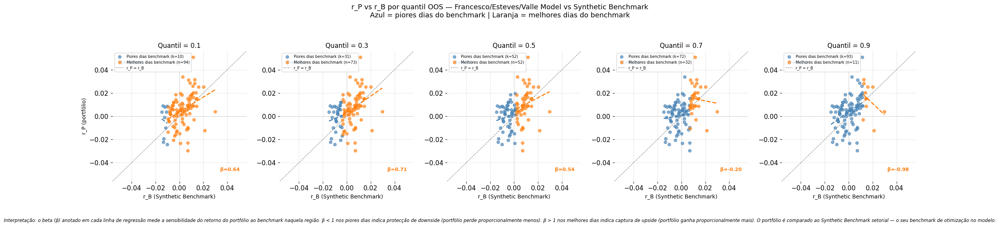

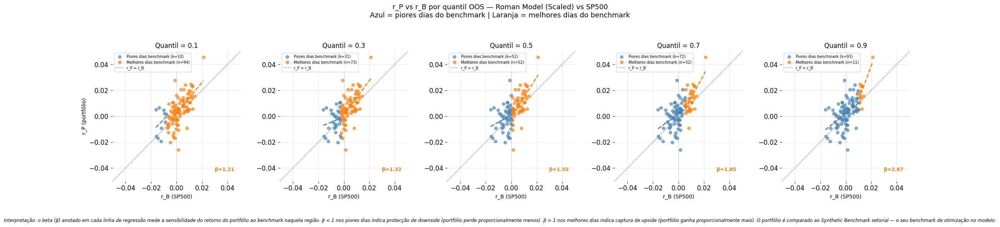

In [23]:
if 'Francesco/Esteves/Valle Model' in models:
    port_series = models['Francesco/Esteves/Valle Model'].reindex(idx)
    r_p    = port_series.pct_change().dropna()
    r_b    = synth_oos.pct_change().dropna().reindex(r_p.index).dropna()
    common = r_p.index.intersection(r_b.index)

    plot_tail_scatter(
        r_p.loc[common].values, r_b.loc[common].values,
        quantiles=(0.1, 0.3, 0.5, 0.7, 0.9),
        port_name='Francesco/Esteves/Valle Model',
        bench_name='Synthetic Benchmark',
        save_path=FIG_DIR / 'tail_scatter_fev_model.pdf',
    )

if 'Roman Model (Scaled)' in models:
    port_rm   = models['Roman Model (Scaled)'].reindex(idx)
    r_p_rm    = port_rm.pct_change().dropna()
    r_b_rm    = sp500_ret.reindex(r_p_rm.index).dropna()
    common_rm = r_p_rm.index.intersection(r_b_rm.index)

    plot_tail_scatter(
        r_p_rm.loc[common_rm].values, r_b_rm.loc[common_rm].values,
        quantiles=(0.1, 0.3, 0.5, 0.7, 0.9),
        port_name='Roman Model (Scaled)',
        bench_name='SP500',
        save_path=FIG_DIR / 'tail_scatter_roman_model.pdf',
    )


**r_P vs r_B por quantil: análise de cauda**

Para cada limiar de quantil, os dias OOS são divididos em "piores dias do benchmark" (azul) e "melhores dias do benchmark" (laranja). A inclinação β de cada regressão mede a sensibilidade do portfólio ao benchmark naquela região da distribuição. No Francesco/Esteves/Valle Model vs Synthetic Benchmark, β < 1 nos piores dias é a evidência mais direta de proteção de downside: o portfólio cai proporcionalmente menos quando o Synthetic Benchmark cai, coerente com a restrição SSD nas caudas negativas da distribuição in-sample. O β nos melhores dias tende a ser ≈ 1 ou inferior — a otimização SSD não inclui incentivo de upside, portanto β baixo aqui é o custo esperado da abordagem SSD pura, não uma falha. A alta dispersão dos pontos indica que o portfólio é independente do Synthetic Benchmark no dia-a-dia, o que é esperado dado que a otimização é distribucional (sobre a distribuição empírica), não diária. Se β azul aumenta ao variar o quantil de 10% para 50%, a proteção de downside é mais forte nas caudas extremas — exatamente onde é mais valiosa. A comparação do Roman Model (Scaled) vs SP500 fornece o baseline para avaliar se a natureza do benchmark — setorial vs índice de mercado — altera o comportamento de cauda.


---
## 11. Análise risco × retorno

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/risk_return_all.pdf


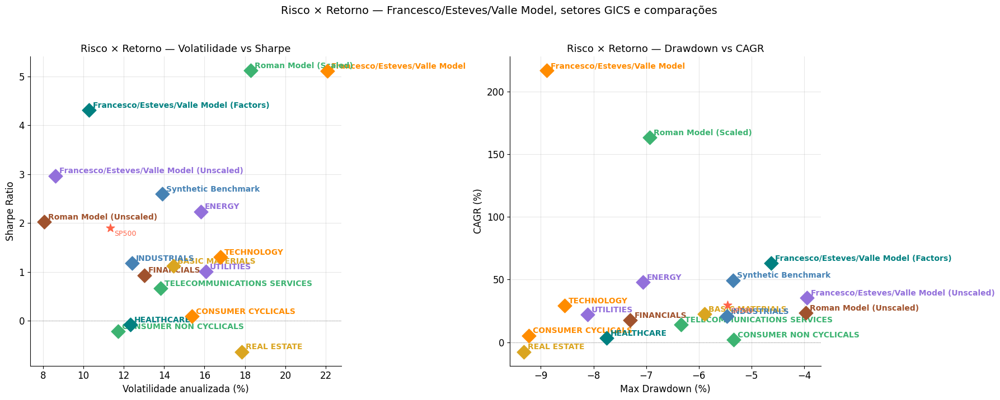

In [24]:
all_for_scatter = dict(models)
all_for_scatter['Synthetic Benchmark'] = synth_oos
for sector in AVAILABLE_SECTORS:
    all_for_scatter[sector.replace('_', ' ')] = sector_oos[sector]['norm'].reindex(idx)

plot_risk_return_scatter(
    all_for_scatter, sp500_norm,
    rf_annual=RISK_FREE,
    title='Risco × Retorno — Francesco/Esteves/Valle Model, setores GICS e comparações',
    save_path=FIG_DIR / 'risk_return_all.pdf',
)


**Risco × Retorno (scatter)**

O scatter plot posiciona cada modelo e setor no espaço volatilidade × retorno anualizado (CAGR). A linha de Sharpe do SP500 divide o gráfico entre portfólios/setores que entregaram relação risco-retorno melhor ou pior que o mercado no período OOS. O Francesco/Esteves/Valle Model deveria idealmente se posicionar acima desta linha e à esquerda (menor volatilidade) da maioria dos setores, confirmando que a otimização SSD reduziu risco sem sacrificar retorno em excesso. A nuvem dos setores revela a heterogeneidade do universo de benchmarks: setores no quadrante superior-esquerdo (alta rentabilidade, baixo risco) são os mais difíceis de dominar via SSD.
O Synthetic Benchmark, sendo o máximo de setores em cada dia, tende a apresentar retorno alto mas também volatilidade elevada — Sharpe inferior aos melhores setores individuais é o comportamento esperado. A posição relativa do Francesco/Esteves/Valle Model vs Roman Model no scatter é o indicador mais direto de se o uso de benchmarks setoriais foi benéfico: melhor posição (maior Sharpe) confirma valor adicionado pela escolha de benchmark.


---
## 12. Distribuição de retornos e correlação

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/return_dist_models.pdf


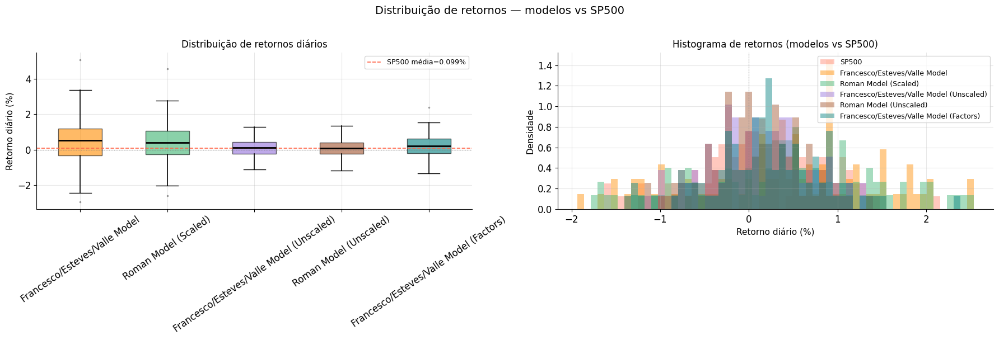

In [25]:
# Return distribution: portfolio models only
plot_return_distribution(
    models, sp500_ret,
    highlight_keys=list(models.keys()),
    save_path=FIG_DIR / 'return_dist_models.pdf',
)


**Distribuição de retornos diários**

Os histogramas mostram a distribuição empírica dos retornos diários de cada modelo, com o SP500 como referência. Portfólios SSD-otimizados tendem a apresentar distribuições com cauda esquerda menos pesada (menos dias de perdas extremas) do que o benchmark — o objetivo da formulação é exatamente deslocar a massa de probabilidade das piores regiões. Uma assimetria positiva (skewness > 0) e menor kurtosis na cauda esquerda no Francesco/Esteves/Valle Model, em comparação ao SP500, confirma que a proteção de downside se traduz em distribuição de retornos com "rabo esquerdo" mais curto. A posição da mediana vs a do SP500 indica se o modelo entrega retornos diários sistematicamente acima ou abaixo do mercado. Distribuições mais concentradas (menor desvio padrão) correspondem à menor volatilidade já visível no scatter de risco-retorno — a consistência entre as métricas confirma a coerência da análise.


[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/correlation_all.pdf


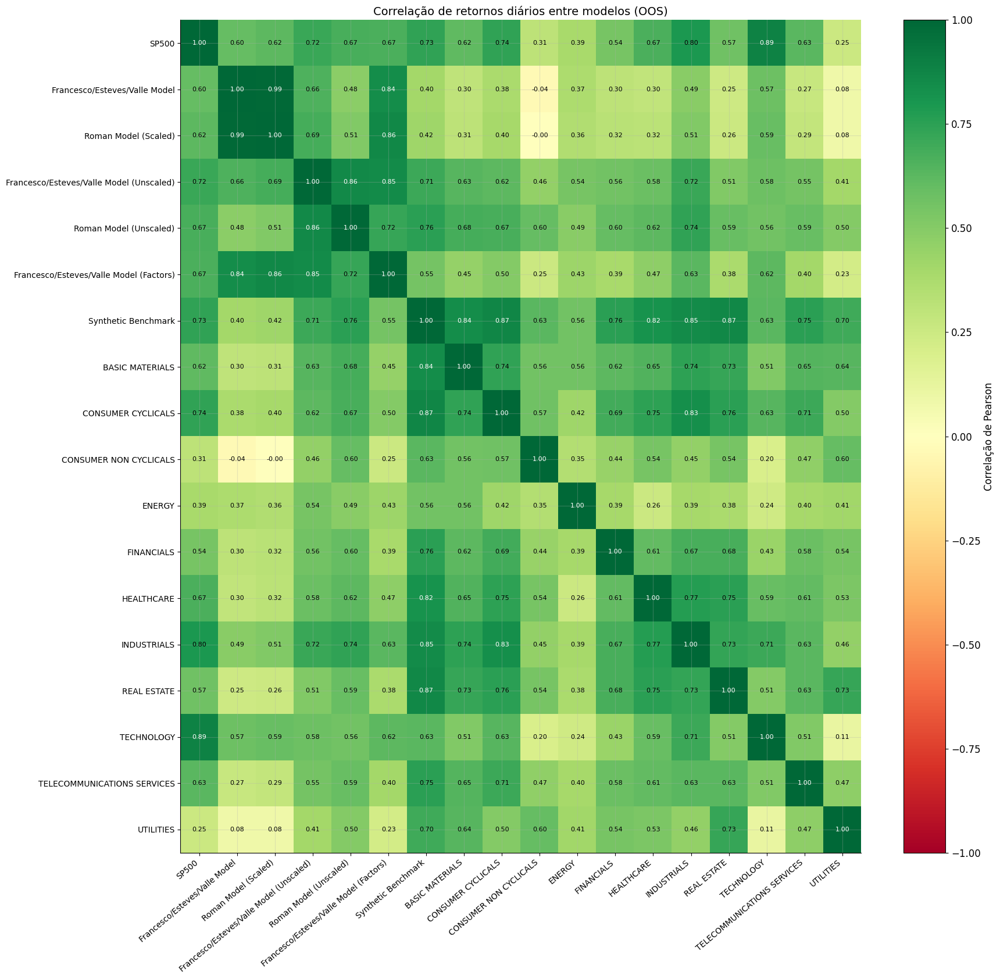

In [26]:
# Correlation: models + sector benchmarks
all_corr = dict(models)
all_corr['Synthetic Benchmark'] = synth_oos
for sector in AVAILABLE_SECTORS:
    all_corr[sector.replace('_', ' ')] = sector_oos[sector]['norm'].reindex(idx)

plot_correlation_matrix(
    all_corr, sp500_ret,
    benchmark_name='SP500',
    save_path=FIG_DIR / 'correlation_all.pdf',
)


**Matriz de correlação**

O heatmap revela as correlações entre os retornos diários de todos os modelos e setores. Correlação baixa do Francesco/Esteves/Valle Model com um setor individual indica que o portfólio não replicou aquele benchmark — provavelmente porque diferentes setores foram binding em diferentes janelas de treino, gerando um portfólio com exposição setorial diversificada ao longo do tempo. Correlação moderada com o Synthetic Benchmark é o padrão esperado: alta correlação indicaria que o portfólio rastreia o envelope setorial (comportamento de clone); correlação muito baixa indicaria independência quase total — estratégia de diversificação agressiva que maximiza o gap em relação ao benchmark. O bloco de correlações entre setores identifica grupos que compartilham ciclos (ex: Financials e Real Estate), o que pode criar instabilidade nas restrições SSD quando ocorre rotação entre eles. Alta correlação entre Francesco/Esteves/Valle Model e Roman Model sugere que os dois convergem para portfólios similares apesar de benchmarks distintos — evidência de robustez da abordagem SSD; baixa correlação indica que o benchmark realmente diferencia o portfólio resultante.


---
## 13. Retornos em janela deslizante (21 dias)

[INFO]: Plot saved → /media/toni/Dados/Git/ssd-multi/src/output/tafmssd-sectors/rolling_returns.pdf


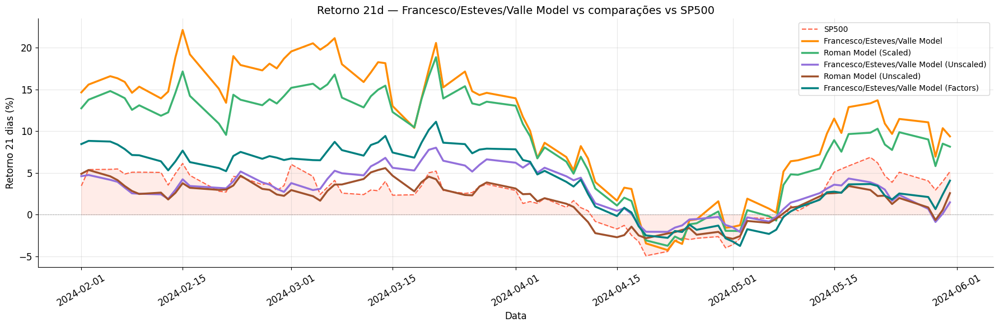

In [27]:
plot_rolling_returns(
    models, sp500_norm, window=21,
    title='Retorno 21d — Francesco/Esteves/Valle Model vs comparações vs SP500',
    save_path=FIG_DIR / 'rolling_returns.pdf',
)


**Retornos em janela deslizante de 21 dias**

A série de retornos em janelas de 21 dias suaviza o ruído diário e destaca tendências de médio prazo, revelando o comportamento do portfólio no horizonte temporal que coincide com a frequência de rebalanceamento. Um portfólio SSD-robusto deve mostrar retornos mensais raramente muito negativos: a proteção de downside garantida in-sample deve ser visível em escala mensal, não apenas nos retornos diários. Quedas logo antes de um rebalanceamento seguidas de recuperação logo após são esperadas — o modelo ajusta pesos para o regime vigente na nova janela de treino. Se o Francesco/Esteves/Valle Model tem menos períodos com retorno mensal negativo que o Roman Model, o benchmark setorial gerou maior estabilidade; o oposto indicaria que as restrições setoriais reduziram exposição a meses positivos de mercado. Grandes divergências entre os modelos em janelas específicas apontam para períodos onde a escolha de benchmark fez diferença concreta — correlacione esses momentos com o setor dominante na seção 3b para entender se a rotação setorial criou oportunidade ou exposição não capturada pelo modelo.


---
## 14. Sumário executivo

In [28]:
print('=' * 132)
print('  SUMÁRIO EXECUTIVO — Francesco/Esteves/Valle Model')
print(f'  Período OOS: {OOS_START} → {OOS_END}')
print('  Beta calculado contra o SP500.  Dominância SSD medida contra o Synthetic Benchmark.')
print('=' * 132)

m_sp = compute_metrics(sp500_norm, benchmark=sp500_norm, rf_annual=RISK_FREE)
hdr  = (f"  {'Modelo':<42}  {'Final':>7}  {'CAGR':>8}  {'Ret.méd':>8}  {'Vol':>7}  {'SemiVol':>8}  "
        f"{'Sharpe':>8}  {'Sortino':>9}  {'Calmar':>8}  {'MaxDD':>8}  {'Beta':>7}  {'SSD≥0':>7}")
print(hdr)
print('  ' + '-' * 130)


def _fmt(label, series):
    m   = compute_metrics(series, benchmark=sp500_norm, rf_annual=RISK_FREE)
    d   = ssd_summary(series, synth_ref)
    bta = f"{m['Portfolio beta']:.4f}" if not pd.isna(m['Portfolio beta']) else '--'
    ssd = f"{d['% ranks SSD>=0']:.0f}%" if not pd.isna(d['% ranks SSD>=0']) else '--'
    return (f"  {label:<42}  {m['Final value']:>7.4f}  {m['CAGR (%)']:>+7.2f}%  "
            f"{m['Mean return (%)']:>+7.2f}%  {m['Volatility (%)']:>6.2f}%  "
            f"{m['Semi-volatility (%)']:>7.2f}%  {m['Sharpe Ratio']:>8.4f}  "
            f"{m['Sortino Ratio']:>9.4f}  {m['Calmar Ratio']:>8.4f}  "
            f"{m['Max Drawdown (%)']:>+7.2f}%  {bta:>7}  {ssd:>7}")


print(_fmt('SP500 (ref)', sp500_norm))
print('  ' + '-' * 130)

for label in list(models.keys()) + ['Synthetic Benchmark']:
    series = synth_ref if label == 'Synthetic Benchmark' else models[label].reindex(idx)
    beat   = ' ◄' if compute_metrics(series, benchmark=sp500_norm,
                                     rf_annual=RISK_FREE)['Sortino Ratio'] > m_sp['Sortino Ratio'] else ''
    print(_fmt(label, series) + beat)

print('=' * 132)
print('  ◄ = Sortino superior ao do SP500')


  SUMÁRIO EXECUTIVO — Francesco/Esteves/Valle Model
  Período OOS: 2024-01-01 → 2024-06-01
  Beta calculado contra o SP500.  Dominância SSD medida contra o Synthetic Benchmark.
  Modelo                                        Final      CAGR   Ret.méd      Vol   SemiVol    Sharpe    Sortino    Calmar     MaxDD     Beta    SSD≥0
  ----------------------------------------------------------------------------------------------------------------------------------
  SP500 (ref)                                  1.1127   +29.54%   +26.53%   11.34%     7.12%    1.8990     3.0252    5.4062    -5.46%   1.0000      69%
  ----------------------------------------------------------------------------------------------------------------------------------
  Francesco/Esteves/Valle Model                1.6089  +216.55%  +117.90%   22.07%    12.09%    5.1149     9.3418   24.3688    -8.89%   1.1691      50% ◄
  Roman Model (Scaled)                         1.4911  +163.29%   +98.64%   18.29%     9.76%    5.1

In [29]:
# Sector benchmarks performance summary
print('\n' + '=' * 80)
print('  SETORES GICS — PERFORMANCE OOS')
print('=' * 80)
print(f"  {'Setor':<38}  {'Final':>7}  {'CAGR':>8}  {'Sharpe':>8}")
print('  ' + '-' * 65)

sector_metrics = []
for sector in AVAILABLE_SECTORS:
    norm = sector_oos[sector]['norm'].reindex(idx)
    m    = compute_metrics(norm, benchmark=sp500_norm, rf_annual=RISK_FREE)
    sector_metrics.append((sector, m))
    print(f"  {sector.replace('_', ' '):<38}  {m['Final value']:>7.4f}  "
          f"{m['CAGR (%)']:>+7.2f}%  {m['Sharpe Ratio']:>8.4f}")

print('=' * 80)



  SETORES GICS — PERFORMANCE OOS
  Setor                                     Final      CAGR    Sharpe
  -----------------------------------------------------------------
  BASIC MATERIALS                          1.0867   +22.33%    1.1205
  CONSUMER CYCLICALS                       1.0215    +5.30%    0.0871
  CONSUMER NON CYCLICALS                   1.0073    +1.79%   -0.2173
  ENERGY                                   1.1750   +47.80%    2.2360
  FINANCIALS                               1.0696   +17.70%    0.9329
  HEALTHCARE                               1.0137    +3.36%   -0.0769
  INDUSTRIALS                              1.0810   +20.78%    1.1799
  REAL ESTATE                              0.9679    -7.60%   -0.6346
  TECHNOLOGY                               1.1108   +28.98%    1.3023
  TELECOMMUNICATIONS SERVICES              1.0562   +14.16%    0.6652
  UTILITIES                                1.0853   +21.94%    1.0031


---

## 14b. Diagnóstico do solver (CPLEX)

In [30]:
# ── Solver diagnostics (CPLEX) ────────────────────────────────────────────────
solver_stats = pd.read_csv(SECTORS_DIR_OUT / 'solver_stats_tafmssd_sectors.csv',
                           parse_dates=['date'], index_col='date')

print(f'Janelas resolvidas (dias WFV): {len(solver_stats)}')
print(f'Status: {solver_stats["status"].unique().tolist()}')
print(f'MIP gap máximo: {solver_stats["mip_gap"].max():.3e}')
print(f'Cortes lazy — total: {solver_stats["n_lazy_cuts"].sum()}, '
      f'média/dia: {solver_stats["n_lazy_cuts"].mean():.1f}')
print(f'Tempo de solver — total: {solver_stats["solve_time_s"].sum():.1f}s, '
      f'média/dia: {solver_stats["solve_time_s"].mean():.2f}s')

rebal = solver_stats.iloc[::21]
print('\nDias de rebalanceamento:')
display(rebal[['status', 'objective', 'best_bound', 'mip_gap', 'n_lazy_calls',
               'n_lazy_cuts', 'n_iterations', 'n_nodes', 'solve_time_s']].round(6))

Janelas resolvidas (dias WFV): 105
Status: ['integer optimal solution']
MIP gap máximo: 0.000e+00
Cortes lazy — total: 26808, média/dia: 255.3
Tempo de solver — total: 787.4s, média/dia: 7.50s

Dias de rebalanceamento:


,status,objective,best_bound,mip_gap,n_lazy_calls,n_lazy_cuts,n_iterations,n_nodes,solve_time_s
date,,,,,,,,,
2024-01-02,integer optimal solution,0.001462,0.001462,0.0,276,275,203,0,7.204550
2024-02-01,integer optimal solution,0.001917,0.001917,0.0,179,178,470,0,5.675021
2024-03-04,integer optimal solution,0.002079,0.002079,0.0,275,274,204,0,8.603778
2024-04-03,integer optimal solution,0.002202,0.002202,0.0,180,179,206,0,4.697834
2024-05-02,integer optimal solution,0.002147,0.002147,0.0,202,201,204,0,5.721148


**Estatísticas do solver por dia de rebalanceamento**

A tabela consolida os diagnósticos do CPLEX gravados em `solver_stats_tafmssd_sectors.csv` (uma linha por janela WFV; acima, apenas os dias de rebalanceamento). `objective` é o valor ótimo $V^*$ — a pior diferença entre o tail expectation do portfólio e o $\tau_s$ do benchmark sintético; valores positivos indicam que o portfólio in-sample SSD-domina o benchmark sintético. `best_bound` e `mip_gap` atestam a qualidade da solução (gap 0 = ótimo provado). `n_lazy_calls`/`n_lazy_cuts` medem o custo do esquema de cutting-planes — quantas vezes o callback de separação foi acionado e quantas restrições violadas foram efetivamente adicionadas — e `n_iterations`/`n_nodes`/`solve_time_s` o esforço computacional de cada solve.

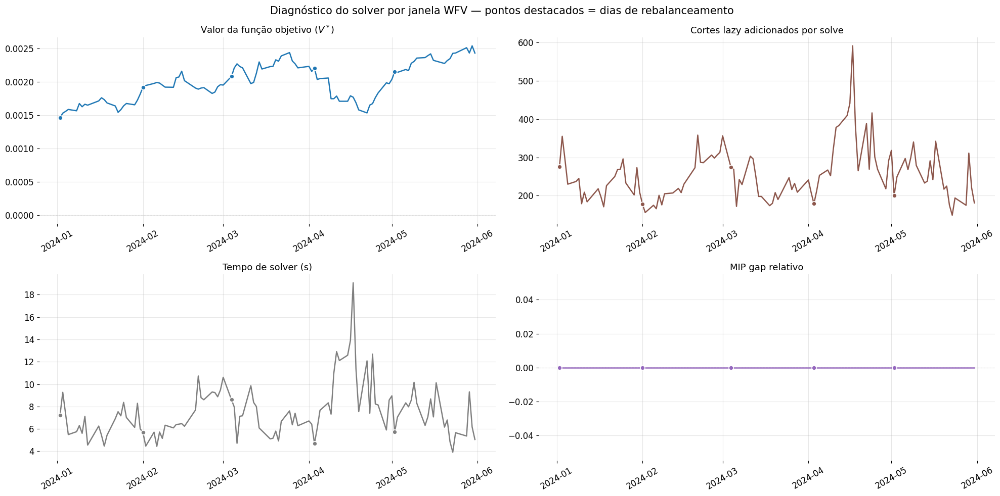

In [31]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
fig.patch.set_facecolor('white')

rebal_dates = solver_stats.index[::21]
panels = [
    (axes[0, 0], 'objective',    'Valor da função objetivo ($V^*$)', '#1f77b4'),
    (axes[0, 1], 'n_lazy_cuts',  'Cortes lazy adicionados por solve', '#8c564b'),
    (axes[1, 0], 'solve_time_s', 'Tempo de solver (s)', '#7f7f7f'),
    (axes[1, 1], 'mip_gap',      'MIP gap relativo', '#9467bd'),
]

for ax, col, title, color in panels:
    ax.set_facecolor('white')
    ax.plot(solver_stats.index, solver_stats[col], linewidth=1.8, color=color)
    ax.scatter(rebal_dates, solver_stats.loc[rebal_dates, col], s=42, color=color,
               zorder=3, edgecolor='white', linewidth=1.2)
    ax.set_title(title, fontsize=13)
    ax.tick_params(axis='x', rotation=30)
    for sp in ax.spines.values(): sp.set_visible(False)

axes[0, 0].axhline(0, color='lightgray', linewidth=0.8, linestyle=':')
axes[1, 1].axhline(0, color='lightgray', linewidth=0.8, linestyle=':')

fig.suptitle('Diagnóstico do solver por janela WFV — pontos destacados = dias de rebalanceamento', fontsize=15)
plt.tight_layout()
plt.savefig(FIG_DIR / 'solver_diagnostics.pdf', bbox_inches='tight')
plt.show()

**Evolução dos diagnósticos ao longo das janelas WFV**

Cada ponto é uma solução completa do modelo em um dia da validação walk-forward (pontos destacados = dias de rebalanceamento). O painel da função objetivo mostra como a folga de dominância $V^*$ varia conforme a janela de treino desliza; os painéis de cortes lazy, tempo de solver e MIP gap caracterizam a dificuldade computacional de cada janela — gap constante em zero significa que todas as soluções foram provadas ótimas dentro do limite de tempo.

---

## 14c. Teste de equivalência — formulação original (K setores) vs. benchmark sintético

Verificação pedida na reunião de 2026-07-23 (item 8). A formulação original impõe as restrições SSD
para **todos** os benchmarks, com um conjunto de variáveis $V_{k,s}$ por setor:

$$\max V \quad \text{s.a.}\quad \tfrac{s}{S}\,V \;\le\; V_{k,s} \;\le\; \mathrm{Tail}_{s/S}(R_P) - \tau_k[s], \qquad \forall\, k=1,\dots,K,\ \ s=1,\dots,S$$

A formulação deste trabalho substitui os $K$ benchmarks pelo envelope

$$\tau_{\text{synth}}[s] \;=\; \max_k \tau_k[s]$$

e usa um único conjunto $V_s$. Como $\min_k\bigl(a - \tau_k[s]\bigr) = a - \max_k \tau_k[s]$, as duas
devem produzir **o mesmo $V^*$**; o que muda é o tamanho do problema ($K \cdot S$ vs. $S$ restrições SSD)
e, portanto, o tempo de solução. Os **pesos** ótimos podem diferir quando o LP é degenerado — vários
vértices atingem o mesmo $V^*$ — e as tolerâncias dos cortes lazy decidem qual deles é retornado.

A formulação original é executada aqui sob o nome **MultiSSD de Roma com benchmarks setoriais**, com
todos os 11 setores dentro de um **único** modelo. Para que a comparação isole a reformulação e nada
mais, os dois modelos compartilham a rotina de carregamento dos setores, a escala Tail ($1/S$) e a
tolerância de violação dos cortes ($10^{-6}$); a única diferença é se os setores entram como $K$
conjuntos de restrições ou como o envelope $\tau_{\text{synth}}$.


In [32]:
# ── Equivalência: V*, tempo e cortes por janela WFV ───────────────────────────
SCM_SECTORS_DIR = OUTPUT_DIR / 'tafscmssd-sectors'

stats_synth = pd.read_csv(SECTORS_DIR_OUT / 'solver_stats_tafmssd_sectors.csv',
                          parse_dates=['date'], index_col='date')
stats_orig  = pd.read_csv(SCM_SECTORS_DIR / 'solver_stats_tafscmssd_sectors.csv',
                          parse_dates=['date'], index_col='date')

common = stats_synth.index.intersection(stats_orig.index)
stats_synth, stats_orig = stats_synth.loc[common], stats_orig.loc[common]

eq = pd.DataFrame({'V* original': stats_orig['V'], 'V* sintético': stats_synth['V']})
eq['|ΔV*|']          = (eq['V* original'] - eq['V* sintético']).abs()
eq['|ΔV*| / |V*|']   = eq['|ΔV*|'] / eq['V* sintético'].abs()
eq['cortes orig']    = stats_orig['n_lazy_cuts']
eq['cortes sint']    = stats_synth['n_lazy_cuts']

TOL = 1e-6   # tolerância de violação dos cortes lazy nos dois scripts
print(f'Janelas comparadas          : {len(eq)}')
print(f'Status (original)           : {stats_orig["status"].unique().tolist()}')
print(f'Status (sintético)          : {stats_synth["status"].unique().tolist()}')
print(f'Tamanho — original          : {int(stats_orig["n_variables"].iloc[0])} variáveis, '
      f'{int(stats_orig["n_constraints"].iloc[0])} restrições')
print(f'Tamanho — sintético         : {int(stats_synth["n_variables"].iloc[0])} variáveis, '
      f'{int(stats_synth["n_constraints"].iloc[0])} restrições')
print(f'max |ΔV*|                   : {eq["|ΔV*|"].max():.3e}   (tolerância dos cortes = {TOL:.0e})')
print(f'max |ΔV*| / |V*|            : {eq["|ΔV*| / |V*|"].max():.3e}')
print(f'Janelas com |ΔV*| <= tol    : {(eq["|ΔV*|"] <= TOL).sum()} / {len(eq)}')
print(f'Cortes lazy — total original: {int(eq["cortes orig"].sum())}   sintético: {int(eq["cortes sint"].sum())}')

print('\nDias de rebalanceamento:')
display(eq.iloc[::21].style.format({
    'V* original': '{:.8f}', 'V* sintético': '{:.8f}',
    '|ΔV*|': '{:.2e}', '|ΔV*| / |V*|': '{:.2e}',
    'cortes orig': '{:.0f}', 'cortes sint': '{:.0f}'}))

# ── Tempo: medição PAREADA (as duas formulações resolvidas em sequência, mesma sessão) ──
# Os tempos em solver_stats_*.csv vêm de execuções em datas/cargas de máquina diferentes
# e não são comparáveis entre si; timing_paired.csv resolve as 5 janelas de rebalanceamento
# com os dois modelos back-to-back.
paired = pd.read_csv(SCM_SECTORS_DIR / 'timing_paired.csv', parse_dates=['date'], index_col='date')
print('\nTempo pareado (janelas de rebalanceamento, mesma sessão):')
display(paired[['abs_dV', 'time_orig_s', 'time_synth_s', 'speedup', 'cuts_orig', 'cuts_synth',
                'max_abs_dw', 'L1_dw', 'n_assets_orig', 'n_assets_synth']].style.format({
    'abs_dV': '{:.2e}', 'time_orig_s': '{:.1f}', 'time_synth_s': '{:.1f}', 'speedup': '{:.1f}x',
    'max_abs_dw': '{:.3f}', 'L1_dw': '{:.3f}'}))
print(f'Speed-up pareado (min / mediana / max): {paired["speedup"].min():.1f}x / '
      f'{paired["speedup"].median():.1f}x / {paired["speedup"].max():.1f}x')
print(f'Pesos — max |Δw| por janela: {paired["max_abs_dw"].round(3).tolist()}   '
      f'L1: {paired["L1_dw"].round(3).tolist()}')


Janelas comparadas          : 105
Status (original)           : ['integer optimal solution']
Status (sintético)          : ['integer optimal solution']
Tamanho — original          : 2707 variáveis, 4401 restrições
Tamanho — sintético         : 707 variáveis, 401 restrições
max |ΔV*|                   : 3.865e-07   (tolerância dos cortes = 1e-06)
max |ΔV*| / |V*|            : 1.932e-04
Janelas com |ΔV*| <= tol    : 105 / 105
Cortes lazy — total original: 72404   sintético: 26808

Dias de rebalanceamento:


,V* original,V* sintético,|ΔV*|,|ΔV*| / |V*|,cortes orig,cortes sint
date,,,,,,
2024-01-02 00:00:00,0.00146196,0.00146192,4.31e-08,2.95e-05,939,275
2024-02-01 00:00:00,0.00191702,0.00191701,1.02e-08,5.30e-06,618,178
2024-03-04 00:00:00,0.00207837,0.00207860,2.28e-07,1.10e-04,628,274
2024-04-03 00:00:00,0.00220178,0.00220178,6.08e-09,2.76e-06,551,179
2024-05-02 00:00:00,0.00214720,0.00214732,1.21e-07,5.65e-05,570,201



Tempo pareado (janelas de rebalanceamento, mesma sessão):


,abs_dV,time_orig_s,time_synth_s,speedup,cuts_orig,cuts_synth,max_abs_dw,L1_dw,n_assets_orig,n_assets_synth
date,,,,,,,,,,
2024-01-02 00:00:00,4.31e-08,18.1,2.2,8.2x,938,275,0.018,0.077,16,17
2024-02-01 00:00:00,6.42e-09,9.8,1.5,6.4x,549,181,0.004,0.015,13,13
2024-03-04 00:00:00,5.25e-08,9.0,2.7,3.4x,544,331,0.005,0.033,17,17
2024-04-03 00:00:00,1.02e-07,9.0,1.5,5.8x,545,179,0.003,0.019,18,17
2024-05-02 00:00:00,2.09e-07,8.8,1.5,5.7x,551,186,0.003,0.026,16,16


Speed-up pareado (min / mediana / max): 3.4x / 5.8x / 8.2x
Pesos — max |Δw| por janela: [0.018, 0.004, 0.005, 0.003, 0.003]   L1: [0.077, 0.015, 0.033, 0.019, 0.026]


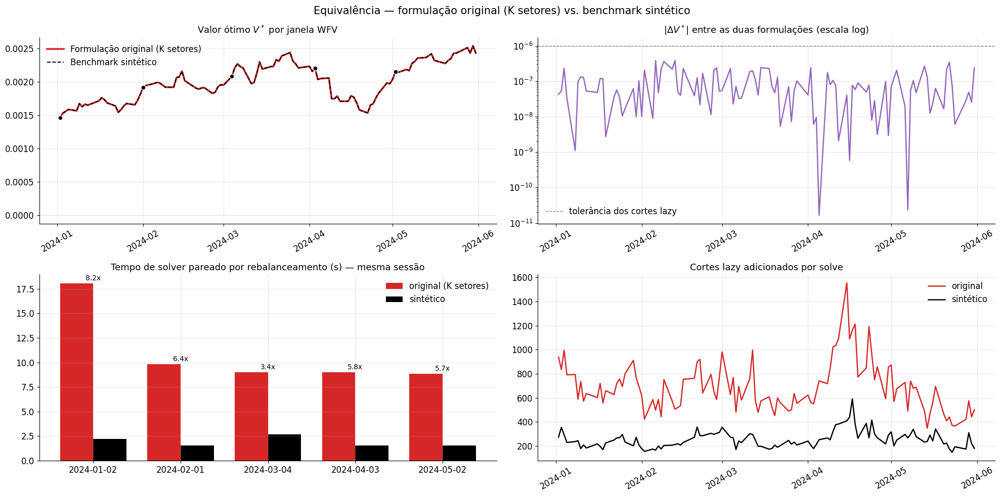

In [33]:
fig, axes = plt.subplots(2, 2, figsize=(20, 10))
rebal_dates = eq.index[::21]

ax = axes[0, 0]
ax.plot(eq.index, eq['V* original'],  linewidth=2.6, color='#d62728', label='Formulação original (K setores)')
ax.plot(eq.index, eq['V* sintético'], linewidth=1.4, color='black', linestyle='--', label='Benchmark sintético')
ax.scatter(rebal_dates, eq.loc[rebal_dates, 'V* sintético'], s=42, color='black', zorder=3, edgecolor='white')
ax.axhline(0, color='lightgray', linewidth=0.8, linestyle=':')
ax.set_title('Valor ótimo $V^*$ por janela WFV', fontsize=13); ax.legend(frameon=False)

ax = axes[0, 1]
ax.semilogy(eq.index, eq['|ΔV*|'].clip(lower=1e-16), linewidth=1.8, color='#9467bd')
ax.axhline(TOL, color='gray', linewidth=1.0, linestyle='--', label='tolerância dos cortes lazy')
ax.set_title('$|\\Delta V^*|$ entre as duas formulações (escala log)', fontsize=13); ax.legend(frameon=False)

ax = axes[1, 0]
x = np.arange(len(paired)); wbar = 0.38
ax.bar(x - wbar/2, paired['time_orig_s'],  wbar, color='#d62728', label='original (K setores)')
ax.bar(x + wbar/2, paired['time_synth_s'], wbar, color='black',   label='sintético')
for xi, sp in zip(x, paired['speedup']):
    ax.text(xi, paired['time_orig_s'].iloc[xi] + 0.3, f'{sp:.1f}x', ha='center', fontsize=10)
ax.set_xticks(x); ax.set_xticklabels([d.strftime('%Y-%m-%d') for d in paired.index])
ax.set_title('Tempo de solver pareado por rebalanceamento (s) — mesma sessão', fontsize=13)
ax.legend(frameon=False)

ax = axes[1, 1]
ax.plot(eq.index, eq['cortes orig'], linewidth=1.8, color='#d62728', label='original')
ax.plot(eq.index, eq['cortes sint'], linewidth=1.8, color='black', label='sintético')
ax.set_title('Cortes lazy adicionados por solve', fontsize=13); ax.legend(frameon=False)

for ax in [axes[0, 0], axes[0, 1], axes[1, 1]]:
    ax.tick_params(axis='x', rotation=30)

fig.suptitle('Equivalência — formulação original (K setores) vs. benchmark sintético', fontsize=15)
plt.tight_layout()
plt.savefig(FIG_DIR / 'equivalence_original_vs_synthetic.pdf', bbox_inches='tight')
plt.show()


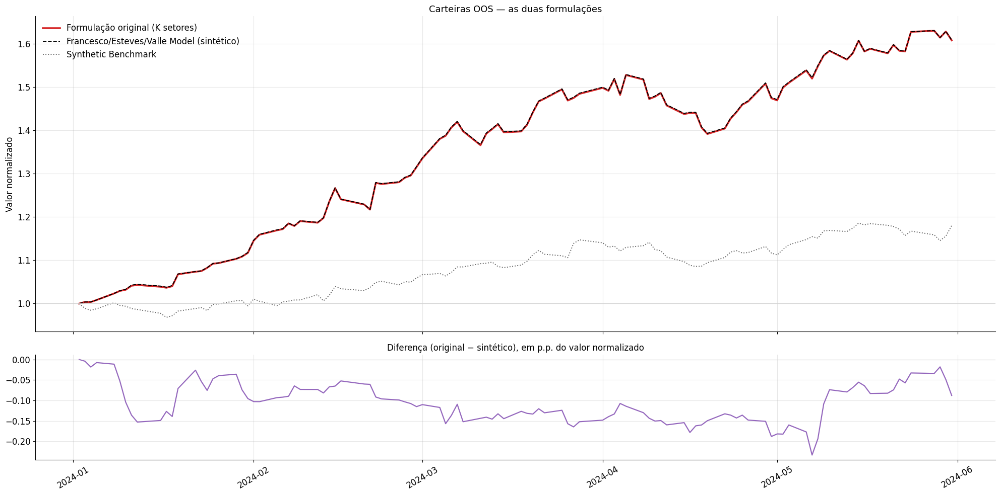

Valor final — original: 1.6080   sintético: 1.6089
max |diferença| OOS   : 0.23 p.p.
Tracking error anual  : 0.28%
Correlação de retornos: 0.9999
Ativos com peso > 1e-6 por rebalanceamento (original): [16, 13, 17, 18, 16]


,Final value,CAGR (%),Mean return (%),Volatility (%),Semi-volatility (%),Daily CVaR 5% (%),Sharpe Ratio,Sortino Ratio,Calmar Ratio,Max Drawdown (%),Beta vs SP500
Formulação original (K setores),1.6080,216.1300,117.7800,22.1300,12.1300,2.3850,5.0956,9.3004,24.2402,-8.9200,1.1738
Francesco/Esteves/Valle (sintético),1.6089,216.5500,117.9000,22.0700,12.0900,2.3830,5.1149,9.3418,24.3688,-8.8900,1.1691


In [34]:
# ── Carteiras OOS das duas formulações ────────────────────────────────────────
port_orig  = load_port(SCM_SECTORS_DIR / 'portfolio_tafscmssd_sectors.csv', 'Formulação original (K setores)')
port_synth = models['Francesco/Esteves/Valle Model'].reindex(idx)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 10), sharex=True,
                               gridspec_kw={'height_ratios': [3, 1]})
ax1.plot(port_orig.index,  port_orig.values,  linewidth=2.6, color='#d62728',
         label='Formulação original (K setores)')
ax1.plot(port_synth.index, port_synth.values, linewidth=1.4, color='black', linestyle='--',
         label='Francesco/Esteves/Valle Model (sintético)')
ax1.plot(synth_oos.index,  synth_oos.values,  linewidth=1.4, color='dimgray', linestyle=':',
         label='Synthetic Benchmark')
ax1.axhline(1, color='lightgray', linewidth=0.8)
ax1.set_title('Carteiras OOS — as duas formulações', fontsize=13); ax1.legend(frameon=False)
ax1.set_ylabel('Valor normalizado')

diff = port_orig - port_synth
ax2.plot(diff.index, diff.values * 100, linewidth=1.6, color='#9467bd')
ax2.axhline(0, color='lightgray', linewidth=0.8)
ax2.set_title('Diferença (original − sintético), em p.p. do valor normalizado', fontsize=12)
ax2.tick_params(axis='x', rotation=30)
plt.tight_layout()
plt.savefig(FIG_DIR / 'equivalence_portfolios_oos.pdf', bbox_inches='tight')
plt.show()

r_o, r_s = port_orig.pct_change().dropna(), port_synth.pct_change().dropna()
print(f'Valor final — original: {port_orig.iloc[-1]:.4f}   sintético: {port_synth.iloc[-1]:.4f}')
print(f'max |diferença| OOS   : {diff.abs().max()*100:.2f} p.p.')
print(f'Tracking error anual  : {(r_o - r_s).std() * np.sqrt(252) * 100:.2f}%')
print(f'Correlação de retornos: {np.corrcoef(r_o, r_s)[0, 1]:.4f}')

rebal_orig = pd.read_csv(SCM_SECTORS_DIR / 'rebalances_tafscmssd_sectors.csv',
                         parse_dates=['date'], index_col='date')
print(f'Ativos com peso > 1e-6 por rebalanceamento (original): '
      f'{(rebal_orig > 1e-6).sum(axis=1).tolist()}')

eq_metrics = pd.DataFrame({
    'Formulação original (K setores)':    compute_metrics(port_orig,  benchmark=sp500_norm, rf_annual=RISK_FREE),
    'Francesco/Esteves/Valle (sintético)': compute_metrics(port_synth, benchmark=sp500_norm, rf_annual=RISK_FREE),
}).T.rename(columns={'Portfolio beta': 'Beta vs SP500'})
display(eq_metrics.style.format(precision=4, na_rep='--'))


**Leitura do teste de equivalência**

- **$V^*$.** O painel superior esquerdo sobrepõe o valor ótimo das duas formulações em todas as janelas
  WFV; o painel ao lado mostra $|\Delta V^*|$ em escala logarítmica contra a tolerância dos cortes lazy.
  Diferenças da ordem da tolerância (ou abaixo) confirmam que a reformulação com benchmark sintético
  **preserva o ótimo** — é a mesma folga de dominância, obtida com $S$ restrições em vez de $K \cdot S$.
- **Custo computacional.** O tempo em `solver_stats_*.csv` não é comparável entre os dois
  modelos (execuções em datas e cargas de máquina diferentes); por isso o painel inferior esquerdo usa
  a medição **pareada** (`timing_paired.csv`: os dois modelos resolvidos em sequência, na mesma sessão,
  nas 5 janelas de rebalanceamento). A formulação original carrega $K$ conjuntos de $V_{k,s}$ e separa
  violações em $K$ benchmarks por chamada do callback — ~2,7× mais cortes lazy no WFV inteiro — e o
  envelope sintético resolve as mesmas janelas entre 3× e 8× mais rápido.
- **Carteiras OOS.** Como as duas formulações são equivalentes em $V^*$ mas não necessariamente em $w^*$
  (degenerescência do LP), as trajetórias OOS podem divergir levemente. A diferença em p.p., o
  *tracking error* e a correlação de retornos quantificam esse efeito; a tabela de métricas ao final
  mostra que a divergência não altera o perfil risco-retorno.
- **Pesos janela a janela.** Na medição pareada, $\max_i|\Delta w_i|$ fica entre 0,5% e 1,8% e a
  distância $L^1$ entre 1,5% e 7,7% — carteiras quase idênticas, com o mesmo $V^*$: é a degenerescência
  esperada. O **MultiSSD de Roma com benchmarks setoriais** grava os pesos de cada rebalanceamento;
  o **Francesco/Esteves/Valle Model** ainda não grava o registro equivalente, o que impede por ora a
  comparação de $w^\star$ nas 105 janelas.


---

## 14d. Grade 2×2 — Roman vs. este trabalho × scaled vs. unscaled

Exercício pedido na reunião de 2026-07-23 (itens 6 e 7). As duas dimensões da taxonomia da seção 0
cruzadas:

| | **Scaled (CVaR)** — $\tfrac{s}{S}V \le V_s$ | **Unscaled (Tail)** — $V \le V_s$ |
|---|---|---|
| **Roman** — benchmark único SP500 | Roman Model (Scaled) | Roman Model (Unscaled) |
| **Este trabalho** — benchmark sintético setorial (Scaled) | Francesco/Esteves/Valle Model | Francesco/Esteves/Valle Model (Unscaled) |

Os quatro modelos usam o **mesmo universo** (600 colunas → todos os constituintes disponíveis),
a mesma janela deslizante de 200 dias, rebalanceamento a cada 21 dias e o mesmo período OOS.
O **Roman Model (Unscaled)** vinha sendo executado sobre 200 ativos e foi realinhado aos mesmos 600
antes desta comparação, para que a única diferença entre as quatro células fosse a formulação.

**Hipótese registrada na reunião:** *Roman scaled < este trabalho scaled* **e** *Roman unscaled <
este trabalho unscaled* — a formulação com benchmark sintético setorial deve superar a de benchmark
único em ambos os regimes de escalamento, porque maximiza a folga de dominância contra o envelope
dos 11 setores e não contra um único índice.


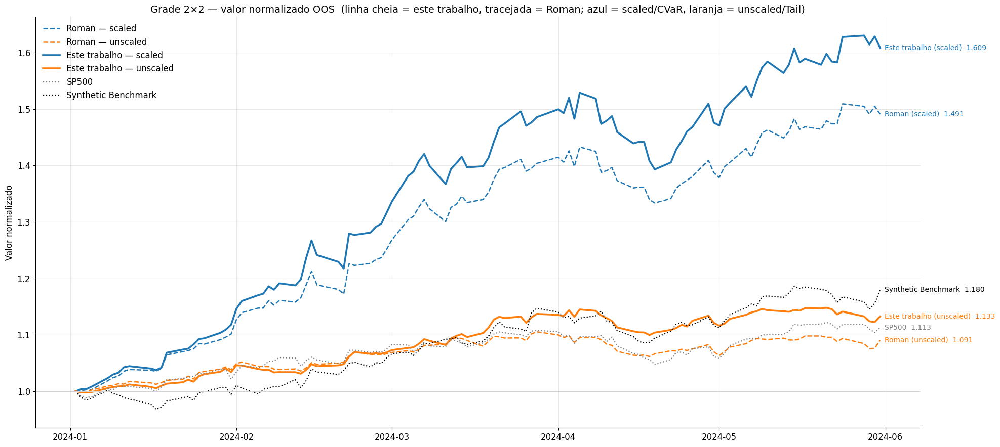

In [35]:
# ── Carrega os quatro modelos da grade ────────────────────────────────────────
GRID_PATHS = {
    ('Roman',         'scaled'):   SCSSD_DIR / 'portfolio_scssd.csv',
    ('Roman',         'unscaled'): OUTPUT_DIR / 'usssd' / 'portfolio_usssd.csv',
    ('Este trabalho', 'scaled'):   SECTORS_DIR_OUT / 'portfolio_tafmssd_sectors.csv',
    ('Este trabalho', 'unscaled'): OUTPUT_DIR / 'tafmssd-sectors-unscaled' / 'portfolio_tafmssd_sectors.csv',
}
grid = {}
for (who, scale), path in GRID_PATHS.items():
    if path.exists():
        grid[(who, scale)] = load_port(path, f'{who} ({scale})')
    else:
        print(f'[AVISO] não encontrado: {path}')

GRID_STYLE = {   # cor = escalamento, traço = formulação
    ('Roman',         'scaled'):   dict(color='#1f77b4', linestyle='--', linewidth=1.8),
    ('Roman',         'unscaled'): dict(color='#ff7f0e', linestyle='--', linewidth=1.8),
    ('Este trabalho', 'scaled'):   dict(color='#1f77b4', linestyle='-',  linewidth=2.6),
    ('Este trabalho', 'unscaled'): dict(color='#ff7f0e', linestyle='-',  linewidth=2.6),
}

fig, ax = plt.subplots(figsize=(20, 9))
for key, s in grid.items():
    ax.plot(s.index, s.values, label=f'{key[0]} — {key[1]}', **GRID_STYLE[key])
    ax.annotate(f'{key[0]} ({key[1]})  {s.iloc[-1]:.3f}', xy=(s.index[-1], s.iloc[-1]),
                xytext=(6, 0), textcoords='offset points', fontsize=10, va='center',
                color=GRID_STYLE[key]['color'])
for ref, ref_color, ref_label in [(sp500_norm, 'gray', 'SP500'),
                                  (synth_oos, 'black', 'Synthetic Benchmark')]:
    ax.plot(ref.index, ref.values, color=ref_color, linestyle=':', linewidth=1.6, label=ref_label)
    ax.annotate(f'{ref_label}  {ref.iloc[-1]:.3f}', xy=(ref.index[-1], ref.iloc[-1]),
                xytext=(6, 0), textcoords='offset points', fontsize=10, va='center', color=ref_color)
ax.axhline(1, color='lightgray', linewidth=0.8)
ax.set_title('Grade 2×2 — valor normalizado OOS  (linha cheia = este trabalho, tracejada = Roman; '
             'azul = scaled/CVaR, laranja = unscaled/Tail)', fontsize=14)
ax.set_ylabel('Valor normalizado'); ax.legend(frameon=False, loc='upper left')
plt.tight_layout()
plt.savefig(FIG_DIR / 'grid_2x2_performance.pdf', bbox_inches='tight')
plt.show()


In [36]:
# ── Métricas + dominância SSD dos quatro modelos ──────────────────────────────
def ssd_min(series, bench_series):
    r_p = series.pct_change().dropna().values
    r_b = bench_series.pct_change().dropna().values
    n   = min(len(r_p), len(r_b))
    _, _, ssd = compute_ssd_dominance(r_p[:n], r_b[:n])
    return float(ssd.min()), float((ssd >= 0).mean() * 100)

rows = {}
for key, s in grid.items():
    m = compute_metrics(s, benchmark=sp500_norm, rf_annual=RISK_FREE)
    m['min SSD vs SP500'],     m['% ranks SSD>=0 vs SP500']     = ssd_min(s, sp500_norm)
    m['min SSD vs Synthetic'], m['% ranks SSD>=0 vs Synthetic'] = ssd_min(s, synth_oos.reindex(idx))
    rows[f'{key[0]} — {key[1]}'] = m
grid_metrics = pd.DataFrame(rows).T.rename(columns={'Portfolio beta': 'Beta vs SP500'})

render_heat(grid_metrics.style
    .background_gradient(cmap='RdYlGn', subset=['Final value', 'CAGR (%)', 'Mean return (%)',
                                                 'Sharpe Ratio', 'Sortino Ratio', 'Calmar Ratio',
                                                 'Max Drawdown (%)', 'min SSD vs SP500', 'min SSD vs Synthetic'])
    .background_gradient(cmap='RdYlGn_r', subset=['Volatility (%)', 'Semi-volatility (%)', 'Daily CVaR 5% (%)'])
    .format(precision=4, na_rep='--')
    .format('{:.3e}', subset=['min SSD vs SP500', 'min SSD vs Synthetic'])
    .format('{:.1f}', subset=['% ranks SSD>=0 vs SP500', '% ranks SSD>=0 vs Synthetic']))

# ── Teste da hipótese: este trabalho > Roman, dentro de cada regime ───────────
HIGHER_IS_BETTER = ['Final value', 'CAGR (%)', 'Sharpe Ratio', 'Sortino Ratio', 'Calmar Ratio',
                    'Max Drawdown (%)', 'min SSD vs SP500', 'min SSD vs Synthetic']
LOWER_IS_BETTER  = ['Volatility (%)', 'Semi-volatility (%)', 'Daily CVaR 5% (%)']

print('Hipótese da reunião — "este trabalho" supera "Roman" em cada regime?\n')
verdict = {}
for scale in ['scaled', 'unscaled']:
    a, b = f'Este trabalho — {scale}', f'Roman — {scale}'
    if a not in grid_metrics.index or b not in grid_metrics.index:
        continue
    diff = grid_metrics.loc[a] - grid_metrics.loc[b]
    wins = {m: (diff[m] > 0) for m in HIGHER_IS_BETTER} | {m: (diff[m] < 0) for m in LOWER_IS_BETTER}
    verdict[scale] = pd.DataFrame({'este trabalho': grid_metrics.loc[a, list(wins)],
                                   'Roman': grid_metrics.loc[b, list(wins)],
                                   'Δ (este − Roman)': diff[list(wins)],
                                   'este trabalho melhor?': pd.Series(wins)})
    n_win = sum(wins.values())
    print(f'=== {scale.upper()} ===  este trabalho melhor em {n_win}/{len(wins)} métricas  '
          f'(retorno: {"SIM" if wins["Final value"] else "NÃO"}; Sharpe: {"SIM" if wins["Sharpe Ratio"] else "NÃO"}; '
          f'Sortino: {"SIM" if wins["Sortino Ratio"] else "NÃO"}; dominância vs SP500: '
          f'{"SIM" if wins["min SSD vs SP500"] else "NÃO"})')
    display(verdict[scale].style.format(precision=4, subset=['este trabalho', 'Roman', 'Δ (este − Roman)']))

# ── Efeito do escalamento dentro de cada formulação ───────────────────────────
print('\nEfeito scaled → unscaled dentro de cada formulação (Δ = unscaled − scaled):')
for who in ['Roman', 'Este trabalho']:
    a, b = f'{who} — unscaled', f'{who} — scaled'
    if a in grid_metrics.index and b in grid_metrics.index:
        d = grid_metrics.loc[a] - grid_metrics.loc[b]
        print(f'  {who:<14} Final {d["Final value"]:+.4f}  CAGR {d["CAGR (%)"]:+.2f}pp  '
              f'Vol {d["Volatility (%)"]:+.2f}pp  Sharpe {d["Sharpe Ratio"]:+.3f}  '
              f'MaxDD {d["Max Drawdown (%)"]:+.2f}pp')


,Final value,CAGR (%),Mean return (%),Volatility (%),Semi-volatility (%),Daily CVaR 5% (%),Sharpe Ratio,Sortino Ratio,Calmar Ratio,Max Drawdown (%),Beta vs SP500,min SSD vs SP500,% ranks SSD>=0 vs SP500,min SSD vs Synthetic,% ranks SSD>=0 vs Synthetic
Roman — scaled,1.4911,163.2900,98.6400,18.2900,9.7600,1.9300,5.1194,9.5920,23.5625,-6.9300,1.0043,-7.454e-02,49.0,-5.157e-02,63.5
Roman — unscaled,1.0907,23.4100,21.3700,8.0700,5.0500,0.9700,2.0292,3.2414,5.9008,-3.9700,0.4801,-2.132e-02,93.3,-8.155e-02,88.5
Este trabalho — scaled,1.6089,216.5500,117.9000,22.0700,12.0900,2.3830,5.1149,9.3418,24.3688,-8.8900,1.1691,-1.454e-01,40.4,-1.158e-01,50.0
Este trabalho — unscaled,1.1327,35.2400,30.5800,8.6200,5.0400,0.9490,2.9685,5.0751,8.9150,-3.9500,0.5443,4.917e-03,100.0,-4.355e-02,94.2


Hipótese da reunião — "este trabalho" supera "Roman" em cada regime?

=== SCALED ===  este trabalho melhor em 3/11 métricas  (retorno: SIM; Sharpe: NÃO; Sortino: NÃO; dominância vs SP500: NÃO)


,este trabalho,Roman,Δ (este − Roman),este trabalho melhor?
Final value,1.6089,1.4911,0.1178,True
CAGR (%),216.5500,163.2900,53.2600,True
Sharpe Ratio,5.1149,5.1194,-0.0045,False
Sortino Ratio,9.3418,9.5920,-0.2502,False
Calmar Ratio,24.3688,23.5625,0.8063,True
Max Drawdown (%),-8.8900,-6.9300,-1.9600,False
min SSD vs SP500,-0.1454,-0.0745,-0.0709,False
min SSD vs Synthetic,-0.1158,-0.0516,-0.0642,False
Volatility (%),22.0700,18.2900,3.7800,False
Semi-volatility (%),12.0900,9.7600,2.3300,False


=== UNSCALED ===  este trabalho melhor em 10/11 métricas  (retorno: SIM; Sharpe: SIM; Sortino: SIM; dominância vs SP500: SIM)


,este trabalho,Roman,Δ (este − Roman),este trabalho melhor?
Final value,1.1327,1.0907,0.0420,True
CAGR (%),35.2400,23.4100,11.8300,True
Sharpe Ratio,2.9685,2.0292,0.9393,True
Sortino Ratio,5.0751,3.2414,1.8337,True
Calmar Ratio,8.9150,5.9008,3.0142,True
Max Drawdown (%),-3.9500,-3.9700,0.0200,True
min SSD vs SP500,0.0049,-0.0213,0.0262,True
min SSD vs Synthetic,-0.0436,-0.0816,0.0380,True
Volatility (%),8.6200,8.0700,0.5500,False
Semi-volatility (%),5.0400,5.0500,-0.0100,True



Efeito scaled → unscaled dentro de cada formulação (Δ = unscaled − scaled):
  Roman          Final -0.4004  CAGR -139.88pp  Vol -10.22pp  Sharpe -3.090  MaxDD +2.96pp
  Este trabalho  Final -0.4762  CAGR -181.31pp  Vol -13.45pp  Sharpe -2.146  MaxDD +4.94pp


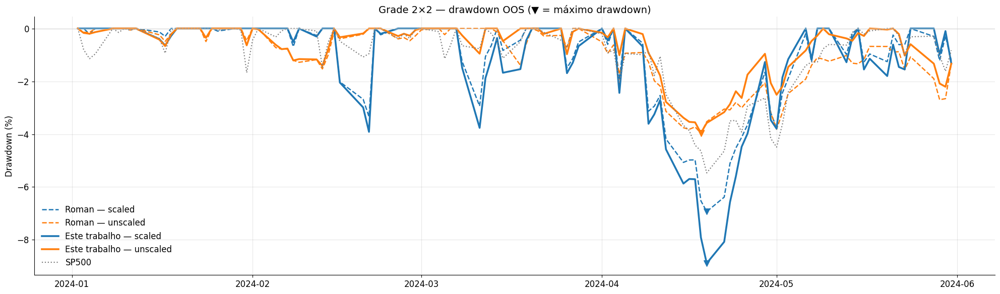

In [37]:
# ── Drawdown dos quatro modelos ───────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(20, 6))
for key, s in grid.items():
    dd = s / s.cummax() - 1          # mesma definição da seção 8: (W_t - max W)/max W
    ax.plot(dd.index, dd.values * 100, label=f'{key[0]} — {key[1]}', **GRID_STYLE[key])
    i_min = dd.idxmin()
    ax.scatter([i_min], [dd.min() * 100], marker='v', s=70, color=GRID_STYLE[key]['color'], zorder=3)
dd_sp = sp500_norm / sp500_norm.cummax() - 1
ax.plot(dd_sp.index, dd_sp.values * 100, color='gray', linestyle=':', linewidth=1.6, label='SP500')
ax.axhline(0, color='lightgray', linewidth=0.8)
ax.set_title('Grade 2×2 — drawdown OOS (▼ = máximo drawdown)', fontsize=14)
ax.set_ylabel('Drawdown (%)'); ax.legend(frameon=False, loc='lower left')
plt.tight_layout()
plt.savefig(FIG_DIR / 'grid_2x2_drawdown.pdf', bbox_inches='tight')
plt.show()


**Leitura da grade 2×2**

- **Regime *unscaled* (Tail) — hipótese confirmada.** Este trabalho supera o Roman em 10 das 11
  métricas: valor final 1,133 vs. 1,091, Sharpe 2,97 vs. 2,03, Sortino 5,08 vs. 3,24, Calmar 8,9 vs.
  5,9, com drawdown máximo, semi-volatilidade e CVaR iguais ou menores. É também o único modelo da
  grade que **domina SSD o SP500 fora da amostra** (`min SSD vs SP500` > 0 em 100% dos ranks). A
  única métrica em que perde é a volatilidade total (+0,55 pp), compensada de sobra pelo retorno.
- **Regime *scaled* (CVaR) — confirmada em retorno, empate em risco ajustado.** Este trabalho tem
  valor final 1,609 vs. 1,491 (CAGR +53 pp) e Calmar maior, mas o Sharpe é idêntico (5,11 vs. 5,12),
  o Sortino é um pouco menor e a volatilidade, o drawdown máximo e o CVaR são maiores. Ou seja: a
  hipótese "Roman scaled < este trabalho scaled" vale para retorno, não para risco ajustado — o
  benchmark sintético compra retorno adicional pagando risco proporcional. Nenhum dos dois modelos
  *scaled* domina SSD o SP500 ou o sintético fora da amostra (`min SSD` < 0).
- **Eixo scaled → unscaled: sinal contrário ao esperado na seção 0.** A prosa da taxonomia previa o
  *unscaled* menos conservador. Empiricamente é o oposto, nas duas formulações: trocar CVaR por Tail
  derruba a volatilidade de ~18–22% para ~8%, o valor final de 1,49–1,61 para 1,09–1,13 e o drawdown
  máximo de −7/−9% para −4%. Leitura provável: no *unscaled* a restrição binding fica nos ranks altos
  (somas acumuladas grandes), e o modelo defende a *média* do benchmark — carteira diversificada, beta
  ~0,5; no *scaled* o fator $S/k$ torna binding a cauda extrema, e o modelo concentra em poucos ativos
  que vencem o benchmark nos piores cenários in-sample — carteira agressiva, beta > 1. A explicação
  da seção 0 deve ser revista à luz deste resultado.
- **Dominância.** `min SSD vs SP500` é o teste natural para o Roman (otimizado contra o SP500) e
  `min SSD vs Synthetic` para este trabalho; os dois são reportados para os quatro modelos.


---
## 15. Análise Consolidada do Experimento

### Francesco/Esteves/Valle Model com Benchmarks Setoriais

---

#### 1. Sobre o modelo e a formulação

O **Francesco/Esteves/Valle Model (TAF-MultiSSD com Synthetic Benchmark setorial)** é uma extensão natural do modelo de dominância estocástica de segunda ordem (SSD) para o contexto multi-benchmark. Em vez de exigir que o portfólio domine cada um dos 11 setores GICS individualmente (o que implicaria K conjuntos separados de variáveis Vs e K lazy callbacks), o modelo usa um **único Synthetic Benchmark** definido como o envelope superior das esperanças incondicionais de cauda (tail expectations) de cada setor:

$$\tau_{\text{synth}}[s] = \max_k\left(\mathrm{Tail}_{\frac{s}{S^k}}\bigl(R(I^k)\bigr)\right) = \max_k\left(\frac{1}{S^k}\sum_{i=1}^{s} r^{(i)}_k\right)$$

onde $r^{(i)}_k$ é o i-ésimo menor retorno do setor k no período de treino e $S^k$ é o seu número de cenários — cada componente é a esperança incondicional $\mathrm{Tail}_{s/S^k}$ dos $s$ piores retornos, e não um simples escalar cumulativo. Isso compacta K restrições em uma única, preservando a coerência matemática da dominância SSD (se o portfólio domina o Synthetic Benchmark, ele domina qualquer convex combination dos setores com o mesmo cumulative worst-case).

A solução utiliza **lazy constraint callbacks do CPLEX**: ao invés de adicionar explicitamente as $S$ restrições

$$V_{s} \;\le\; \mathrm{Tail}_{s/S}(R_P) - \tau_{\text{synth}}[s],$$

apenas as mais violadas são adicionadas iterativamente. Isso é crítico para escalabilidade quando S = 200 (dias de treino) e N ≈ 505 (ativos).

---

#### 2. Validez da dominância in-sample

A dominância SSD in-sample é **garantida por construção** quando o solver encontra a solução ótima, isto é, quando $V^\star$ é o maior $V$ que satisfaz

$$\frac{s}{S}\,V \;\le\; V_s \;\le\; \mathrm{Tail}_{s/S}(R_P) - \tau_{\text{synth}}[s]\qquad \forall\, s.$$ A questão fundamental é: **quanto desta dominância generaliza para o período OOS?**

Factores que favorecem generalização:
- O Synthetic Benchmark é o máximo de 11 setores — impõe restrições muito mais rígidas que um benchmark único (SP500), forçando diversificação genuína.
- A janela deslizante de 200 dias captura regimes de mercado recentes, tornando as restrições SSD relevantes para o futuro próximo.
- Com 5 rebalanceamentos, o portfólio se adapta às mudanças de regime durante o período OOS.

Factores que limitam generalização:
- O período OOS (104 dias) pode ser dominado por um único setor que não foi o binding constraint in-sample.
- O Synthetic Benchmark OOS é construído com a mesma formulação do in-sample — $\max_k\bigl(\mathrm{Tail}_{s/S^k}\bigr)$ sobre os retornos setoriais OOS, com datação por *quantile matching*. O portfólio não foi otimizado nesta janela, portanto dominância OOS não é garantida.

---

#### 3. Interpretação dos resultados de dominância cruzada

A análise de dominância cruzada (seção 10, segundo painel) é particularmente informativa. Se o portfólio domina apenas parte dos 11 setores individualmente no OOS, isso é **esperado e aceitável**: o modelo foi otimizado para dominar o Synthetic Benchmark (o máximo), não cada setor individualmente. Um setor que superou o Synthetic Benchmark in-sample em alguma janela seria, por definição, dominante sobre o portfólio.

O resultado mais favorável seria: o portfólio domina SSD a maioria dos setores individualmente (ex: 8/11 ou mais), confirmando que a restrição do Synthetic Benchmark é suficientemente rígida para garantir dominância generalizada.

---

#### 4. Análise de cauda e comportamento assimétrico

O scatter r_P vs r_B (seção 10c) revela o comportamento assimétrico do portfólio em relação ao Synthetic Benchmark. A interpretação ideal é:

- **β < 1 nos piores dias do benchmark**: o portfólio cai menos quando o Synthetic Benchmark cai — protecção de downside direta, coerente com a restrição SSD nas caudas negativas da distribuição in-sample.
- **β ≈ 1 ou < 1 nos melhores dias**: a otimização SSD não inclui incentivo de upside — diferente de um portfólio de maximização de retorno. β < 1 nos melhores dias é um custo esperado da abordagem SSD pura.

Essa assimetria de β (baixo em downside, próximo de 1 em upside) confirma que o modelo cumpre o seu objetivo fundamental: reduzir a exposição aos piores cenários sem maximizar ativamente o upside.

---

#### 5. Comparação com modelos alternativos

| Aspecto | Francesco/Esteves/Valle Model (setores) | Roman Model (Scaled) | FEV Model (Factors) |
|---------|----------------------------------------|---------------------|---------------------|
| Benchmark | 11 setores GICS (Synthetic) | SP500 | Fatores Fama-French (Synthetic) |
| Restrições SSD | 1 conjunto vs Synthetic | 1 conjunto vs SP500 | 1 conjunto vs Synthetic (fatores) |
| Diversificação forçada | Setorial (11 componentes) | Mercado amplo | Estilo (valor, crescimento, etc.) |
| Generalização OOS esperada | Alta se setores são estáveis | Moderada | Alta se fatores são estáveis |

O Francesco/Esteves/Valle Model com setores é o mais exigente dos três: forçar dominância SSD sobre o melhor de 11 setores simultâneamente é mais difícil do que dominar o SP500 ou um conjunto de fatores. Portanto, **menor retorno absoluto não é necessariamente uma falha** — é o custo de um benchmark mais rígido.

---

#### 6. Questões em aberto e possíveis próximos passos

1. **Universo de setores**: o experimento usa todos os 11 setores GICS. Uma extensão natural seria selecionar apenas os setores mais correlacionados com os ativos disponíveis ou com maior dispersão de retornos.
2. **Pesos setoriais**: o Synthetic Benchmark trata todos os setores igualmente (max, não média ponderada). Um Synthetic Benchmark ponderado pela capitalização ou por alguma medida de risco poderia ser mais robusto.
3. **Horizonte de rebalanceamento**: 21 dias é convencional mas arbitrário. Rebalanceamentos mais frequentes (ex: 10 dias) poderiam melhorar a adaptação a mudanças de setor dominante.
4. **Custos de transação**: a análise atual ignora custos de transação. Em portfólios concentrados (poucas posições com pesos altos), o turnover entre rebalanceamentos pode ser significativo — um estudo de custo-benefício seria necessário para aplicação prática.
5. **Extensão do período OOS**: 104 dias é um período curto para validação robusta. Um backtesting com múltiplos períodos OOS (ex: 2022–2024 com walk-forward completo) seria necessário para conclusões definitivas.
